## update package

In [1]:
!pip install huggingface_hub -q

In [2]:
!pip install wandb==0.16.0 -q

In [3]:
!pip install --upgrade datasets -q
# 없으면 데이터 받을 때, byte 로 받음

In [4]:
!pip install git+https://github.com/tensorflow/examples.git
!pip install git+https://github.com/surmenok/keras_lr_finder

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-l8a17zhf
  Running command git clone --filter=blob:none -q https://github.com/tensorflow/examples.git /tmp/pip-req-build-l8a17zhf
  Resolved https://github.com/tensorflow/examples.git to commit fff4bcda7201645a1efaea4534403daf5fc03d42
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/surmenok/keras_lr_finder to /tmp/pip-req-build-c7_uyufg
  Running command git clone --filter=blob:none -q https://github.com/surmenok/keras_lr_finder /tmp/pip-req-build-c7_uyufg
  Resolved https://github.com/surmenok/keras_lr_finder to commit 3c8fe719d7e3291a1f72ff8a9a1c51e9fc5d520b
  Preparing metadata (setup.py) ... done


## library

In [5]:
import os
import io
import glob
import math
import wandb
import random
import numpy as np
import pandas as pd
from PIL import Image 
from PIL import ImageOps
import huggingface_hub
from tensorflow_examples.models.pix2pix import pix2pix


from skimage.io import imread
from skimage.transform import resize

import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds
from tensorflow.keras import utils
from tensorflow.keras import layers, models
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import ResNet50


import matplotlib.pyplot as plt
from datasets import load_dataset
from wandb.keras import WandbCallback
from IPython.display import clear_output
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split


import albumentations as A
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize, Rotate, GaussNoise, RandomScale

## dataset 구성

In [6]:
from datasets import load_dataset
dataset = load_dataset("nateraw/pascal-voc-2012")

Generating train split:   0%|          | 0/1464 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/1449 [00:00<?, ? examples/s]

In [7]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'mask'],
        num_rows: 1464
    })
    val: Dataset({
        features: ['image', 'mask'],
        num_rows: 1449
    })
})

In [8]:
NUM_CLASSES = 21

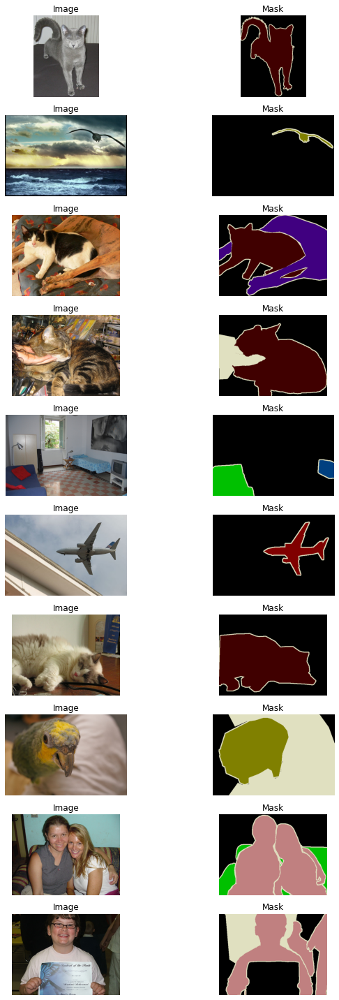

In [9]:
# 이미지와 마스크 데이터셋에서 10개의 샘플을 무작위로 선택
random.seed(42)  # 무작위 결과 재현을 위해 시드 설정
selected_samples = random.sample(range(len(dataset['train'])), 10)

# 선택된 샘플의 이미지와 마스크 시각화
fig, axes = plt.subplots(10, 2, figsize=(10, 20))

for i, sample_idx in enumerate(selected_samples):
    image = dataset['train'][sample_idx]['image']
    mask = dataset['train'][sample_idx]['mask']

    axes[i, 0].imshow(image)
    axes[i, 0].set_title('Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(mask)
    axes[i, 1].set_title('Mask')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [9]:
IMG_HEIGHT = 224
IMG_WIDTH  = 224

## data preprocessing

In [10]:
class_color_mapping ={(0, 0, 0): 0, (128, 0, 0): 1, (192, 128, 128): 2, (224, 224, 192): 3, (0, 64, 128): 4, (64, 0, 128): 5, (192, 0, 0): 6, (128, 128, 0): 7, (128, 0, 128): 8, (0, 0, 128): 9, (192, 128, 0): 10, (128, 192, 0): 11, (64, 128, 128): 12, (192, 0, 128): 13, (64, 128, 0): 14, (0, 128, 0): 15, (128, 128, 128): 16, (64, 0, 0): 17, (0, 192, 0): 18, (0, 128, 128): 19, (0, 64, 0): 20, (128, 64, 0): 21}

In [11]:
def map_colors_to_labels(seg, color_mapping):
    # 세그멘테이션 마스크의 높이와 너비를 얻습니다.
    height, width = seg.shape[:2]
    non_zero_indices = np.nonzero(seg)

    # 행과 열 인덱스를 튜플로 묶어 딕셔너리 생성
    index_dict = {}
        
    for i in range(len(non_zero_indices[0])):
        key = (non_zero_indices[0][i], non_zero_indices[1][i])
        index_dict[key] = 1             
    # 새로운 레이블 배열을 생성합니다.
    label_seg = np.zeros((height, width), dtype=np.int32)
    for i in index_dict.keys():
        
        y = i[0]
        x = i[1]
        
        # 현재 픽셀의 RGB 값을 가져옵니다.
        pixel = tuple(seg[y, x])

        # RGB 값에 해당하는 레이블을 찾아 할당합니다.
        label_seg[y, x] = color_mapping.get(pixel, 0)  # 기본값으로 0을 사용
            
    return label_seg

In [12]:
from PIL import ImageOps

def data_concat(dataset):
    
    img_arr = []
    seg_arr = []

    img_arr_temp = dataset['train']['image'] + dataset['val']['image']

    seg_arr_temp = dataset['train']['mask'] + dataset['val']['mask']
    
    for img, seg in zip(img_arr_temp, seg_arr_temp):
        img = np.array(img.resize((IMG_WIDTH, IMG_HEIGHT)))
        seg = np.argmax(np.array(seg.resize((IMG_WIDTH, IMG_HEIGHT))), axis=-1)
        seg[seg == 255] = 21
        #img = np.array(img.resize((IMG_WIDTH, IMG_HEIGHT),Image.NEAREST))
        #seg = np.array(seg.resize((IMG_WIDTH, IMG_HEIGHT),Image.NEAREST))
        #label_seg = map_colors_to_labels(seg, class_color_mapping)
        img_arr.append(img)
        #seg_arr.append(label_seg)
        seg_arr.append(seg)
    
    return np.array(img_arr), np.array(seg_arr)

In [13]:
full_dataset = tf.data.Dataset.from_tensor_slices(data_concat(dataset))

In [14]:
print(full_dataset)

<TensorSliceDataset shapes: ((224, 224, 3), (224, 224)), types: (tf.uint8, tf.int64)>


In [15]:
DATASET_SIZE = 2913

In [16]:
train_size = int(0.7 * DATASET_SIZE)
val_size = int(0.2 * DATASET_SIZE)
test_size = int(0.1 * DATASET_SIZE)

full_dataset = full_dataset.shuffle(buffer_size = DATASET_SIZE)
train_dataset = full_dataset.take(train_size)
test_dataset = full_dataset.skip(train_size)
val_dataset = test_dataset.skip(test_size)
test_dataset = test_dataset.take(test_size)

In [17]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

In [18]:
def load_image_train(input_image, input_mask):
    input_mask = input_mask[..., np.newaxis]

    # 데이터 증강
    # 랜덤 좌우 반전
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    # 랜덤 밝기 조정
    input_image = tf.image.random_brightness(input_image, max_delta=0.1)

    # 랜덤 대비 조정
    input_image = tf.image.random_contrast(input_image, lower=0.8, upper=1.2)

    # 랜덤 색상 조정
    input_image = tf.image.random_hue(input_image, max_delta=0.08)
    input_image = tf.image.random_saturation(input_image, lower=0.7, upper=1.3)

    # 랜덤 회전
    rotation_factor = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    input_image = tf.image.rot90(input_image, rotation_factor)
    input_mask = tf.image.rot90(input_mask, rotation_factor)

    # 정규화
    input_image, input_mask = normalize(input_image, input_mask)

    input_mask = input_mask[:, :, 0]

    return input_image, input_mask

In [19]:
def load_image_test(input_image, input_mask):
    input_mask = input_mask[np.newaxis, ...]
    
    
    input_mask = input_mask[0]
    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

In [20]:
BATCH_SIZE = 16
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = train_size // BATCH_SIZE

In [21]:
train = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
val   = train_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = test_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)

In [22]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)
val_dataset = val.batch(BATCH_SIZE)

(224, 224, 3)


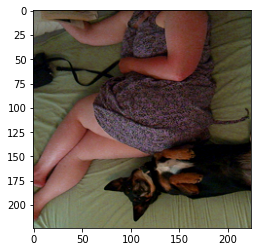

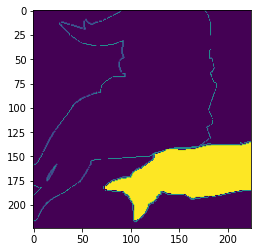

(224, 224, 3)


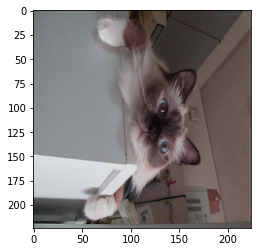

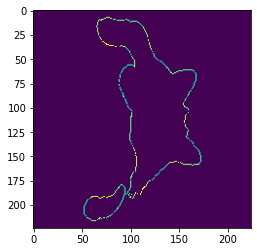

(224, 224, 3)


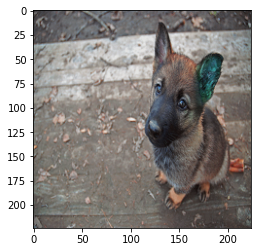

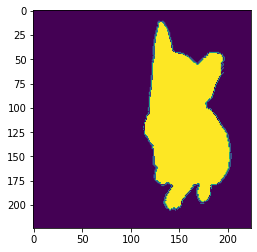

(224, 224, 3)


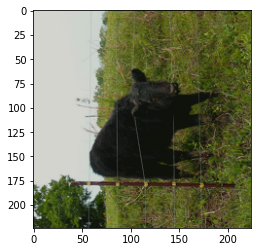

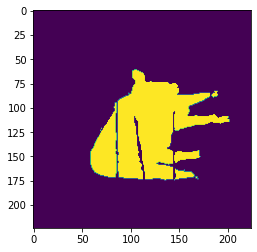

(224, 224, 3)


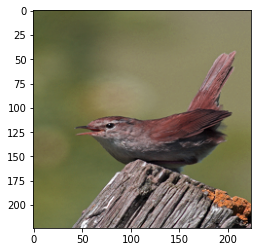

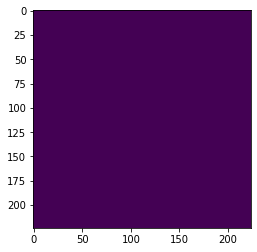

(224, 224, 3)


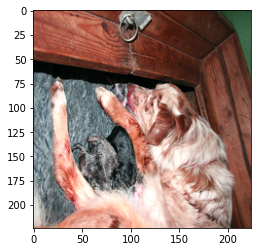

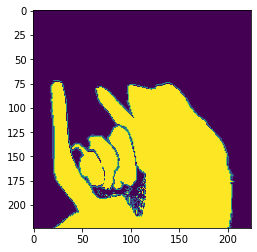

(224, 224, 3)


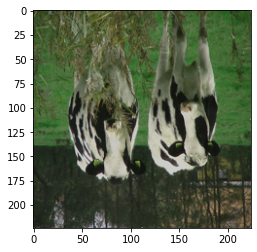

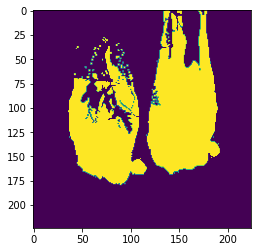

(224, 224, 3)


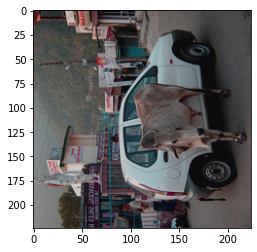

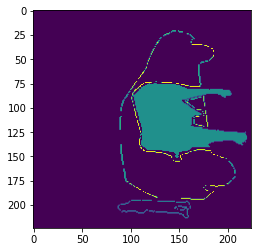

(224, 224, 3)


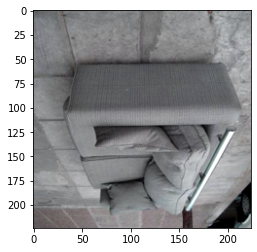

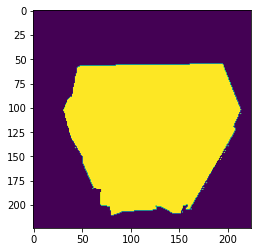

(224, 224, 3)


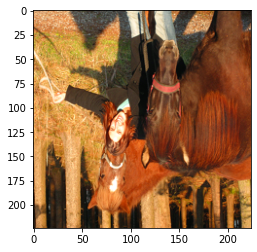

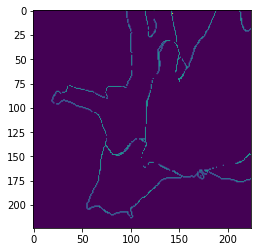

In [56]:
for image, mask in train.take(10):
    sample_image, sample_mask = image, mask
    plt.imshow(sample_image)
    print(sample_image.shape)
    plt.show()
    plt.imshow(sample_mask)
    plt.show()

## 모델 구성

In [23]:
def conv2(filters, x, kernel_size =3) :
    x = Conv2D(filters, kernel_size , activation='relu', padding= 'same',kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x) 
    x = Conv2D(filters, kernel_size , activation='relu', padding= 'same' ,kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x) 
    return x

In [24]:
def conv3(filters, x, kernel_size = 3) :
    x = conv2(filters, x, kernel_size )
    x = Conv2D(filters, kernel_size, activation='relu', padding='same',kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    return x

In [25]:
def ccm(filters, x):
    x = conv2(filters, x)
    x = MaxPooling2D(pool_size =(2,2))(x)
    return x

In [26]:
def cccm(filters, x) :
    x = conv3(filters, x )
    x = MaxPooling2D(pool_size =(2,2))(x)
    return x

### FCN 32s same

In [27]:
def build_fcn32_same(input_shape = (224,224,3)):
    inputs = Input(input_shape)
    
    filters = [64, 128, 256, 512, 4096, NUM_CLASSES]
    
    block1 = ccm(filters[0], inputs)
    block2 = ccm(filters[1], block1)
    block3 = cccm(filters[2], block2)
    block4 = cccm(filters[3], block3)
    block5 = cccm(filters[3], block4)
    
    fc1 = Conv2D(filters[4], kernel_size =7, activation ='relu', padding ='same', kernel_initializer='he_normal')(block5)
    fc1 = Dropout(0.5)(fc1)
    
    fc2 = Conv2D(filters[4], kernel_size =1, activation ='relu', padding ='same', kernel_initializer='he_normal')(fc1)
    fc2 = Dropout(0.5)(fc2)
    
    fc3 = Conv2D(filters[5], kernel_size =1, activation ='relu', padding ='same', kernel_initializer='he_normal')(fc2)
       
    upsample = Conv2DTranspose(filters[5], kernel_size = 32, strides = 32, padding = 'valid')(fc3)
    
    #softmax = Activation('softmax')(upsample)
    outputs = upsample
    
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [28]:
fcn32_same = build_fcn32_same()
fcn32_same.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 224, 224, 64)      1792      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 64)      256       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 64)      36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 224, 224, 64)      256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 128)     73856 

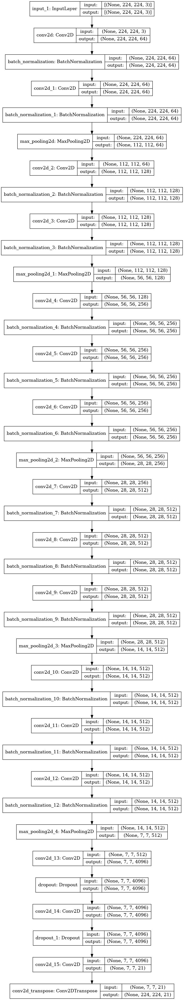

In [25]:
utils.plot_model(fcn32_same, show_shapes =True)

### FCN 16s same

In [29]:
def build_fcn16_same(input_shape = (224,224,3)):
    inputs = Input(input_shape)
    
    filters = [64, 128, 256, 512, 4096, NUM_CLASSES]
    
    block1 = ccm(filters[0], inputs)
    block2 = ccm(filters[1], block1)
    block3 = cccm(filters[2], block2)
    block4 = cccm(filters[3], block3)
    block5 = cccm(filters[3], block4)
    
    fc1 = Conv2D(filters[4], kernel_size =7, activation ='relu', padding ='same', kernel_initializer='he_normal')(block5)
    fc1 = Dropout(0.5)(fc1)
    
    fc2 = Conv2D(filters[4], kernel_size =1, activation ='relu', padding ='same', kernel_initializer='he_normal')(fc1)
    fc2 = Dropout(0.5)(fc2)
    
    fc3 = Conv2D(filters[5], kernel_size =1, activation ='relu', padding ='same', kernel_initializer='he_normal')(fc2)
    up_fc3 = Conv2DTranspose(filters[5], kernel_size = 4, strides = 2, padding = 'valid')(fc3)
    crop_up_fc3 = Cropping2D(cropping = (1,1))(up_fc3)
    
    conv_block4 = Conv2D(filters[5], kernel_size = 1, activation ='relu', padding ='same', kernel_initializer='he_normal')(block4)
    
    sum_fc3_block4 = Add()([crop_up_fc3, conv_block4])
    
    up = Conv2DTranspose(filters[5], kernel_size = 16, strides = 16, padding = 'valid')(sum_fc3_block4) 
    #softmax = Activation('softmax')(up)
    
    outputs = up
    
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [30]:
fcn16_same = build_fcn16_same()
fcn16_same.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_16 (Conv2D)              (None, 224, 224, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_13 (BatchNo (None, 224, 224, 64) 256         conv2d_16[0][0]                  
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 224, 224, 64) 36928       batch_normalization_13[0][0]     
____________________________________________________________________________________________

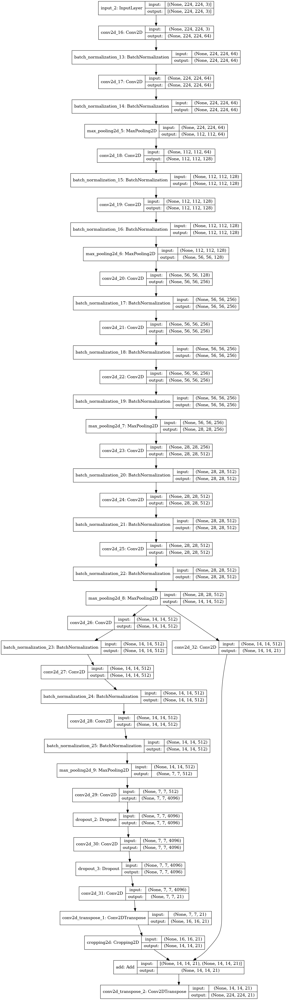

In [28]:
utils.plot_model(fcn16_same, show_shapes = True)

### FCN 8s same

In [29]:
def build_fcn8_same(input_shape = (224,224,3)):
    inputs = Input(input_shape)
    
    filters = [64, 128, 256, 512, 4096, NUM_CLASSES]
    
    block1 = ccm(filters[0], inputs)
    block2 = ccm(filters[1], block1)
    block3 = cccm(filters[2], block2)
    block4 = cccm(filters[3], block3)
    block5 = cccm(filters[3], block4)
    
    fc1 = Conv2D(filters[4], kernel_size =7, activation ='relu', padding ='same', kernel_initializer='he_normal')(block5)
    fc1 = Dropout(0.5)(fc1)
    
    fc2 = Conv2D(filters[4], kernel_size =1, activation ='relu', padding ='same', kernel_initializer='he_normal')(fc1)
    fc2 = Dropout(0.5)(fc2)
    
    fc3 = Conv2D(filters[5], kernel_size =1, activation ='relu', padding ='same', kernel_initializer='he_normal')(fc2)
    up_fc3 = Conv2DTranspose(filters[5], kernel_size = 4, strides = 2, padding = 'valid')(fc3)  # (None, 16, 16, 21)
    crop_up_fc3 = Cropping2D(cropping = (1,1))(up_fc3) # (None, 14, 14, 21)
    
    conv_block4 = Conv2D(filters[5], kernel_size = 1, activation ='relu', padding ='same', kernel_initializer='he_normal')(block4)
    
    sum_fc3_block4 = Add()([crop_up_fc3, conv_block4])
    up_sum = Conv2DTranspose(filters[5], kernel_size = 4, strides = 2, padding = 'valid')(sum_fc3_block4)  # (None, 30, 30, 21)
    crop_up = Cropping2D(cropping = (1,1))(up_sum) # (None, 28, 28, 21)
    
    conv_block3 = Conv2D(filters[5], kernel_size = 1, activation ='relu', padding ='same', kernel_initializer='he_normal')(block3)
    
    sum_crop_block3 = Add()([crop_up, conv_block3])
    
    up = Conv2DTranspose(filters[5], kernel_size = 8, strides = 8, padding = 'valid')(sum_crop_block3) 
    #softmax = Activation('softmax')(up)
    
    outputs = up
    
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [30]:
fcn8_same = build_fcn8_same()
fcn8_same.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_33 (Conv2D)              (None, 224, 224, 64) 1792        input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_26 (BatchNo (None, 224, 224, 64) 256         conv2d_33[0][0]                  
__________________________________________________________________________________________________
conv2d_34 (Conv2D)              (None, 224, 224, 64) 36928       batch_normalization_26[0][0]     
____________________________________________________________________________________________

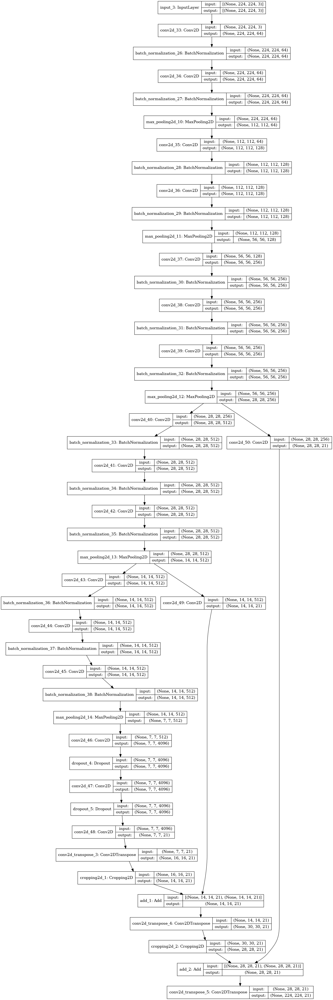

In [31]:
utils.plot_model(fcn8_same, show_shapes = True)

### FCN 32s valid

In [32]:
def build_fcn32_valid(input_shape = (224,224,3)):
    inputs = Input(input_shape)
    
    filters = [64, 128, 256, 512, 4096, NUM_CLASSES]
    
    block1 = ccm(filters[0], inputs)
    block2 = ccm(filters[1], block1)
    block3 = cccm(filters[2], block2)
    block4 = cccm(filters[3], block3)
    block5 = cccm(filters[3], block4)
    
    fc1 = Conv2D(filters[4], kernel_size =7, activation ='relu', padding ='valid', kernel_initializer='he_normal')(block5)
    fc1 = Dropout(0.5)(fc1)
    
    fc2 = Conv2D(filters[4], kernel_size =1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(fc1)
    fc2 = Dropout(0.5)(fc2)
    
    fc3 = Conv2D(filters[5], kernel_size =1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(fc2)
       
    upsample = Conv2DTranspose(filters[5], kernel_size = 256, strides = 64, padding = 'valid', kernel_initializer='he_normal')(fc3)
    crop = Cropping2D(cropping = (16,16))(upsample)
    
    
    #softmax = Activation('softmax')(crop)
    outputs = crop
    
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [33]:
fcn32_valid = build_fcn32_valid()
fcn32_valid.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 224, 224, 64)      1792      
_________________________________________________________________
batch_normalization_39 (Batc (None, 224, 224, 64)      256       
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 224, 224, 64)      36928     
_________________________________________________________________
batch_normalization_40 (Batc (None, 224, 224, 64)      256       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 112, 112, 64)      0         
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 112, 112, 128)     7385

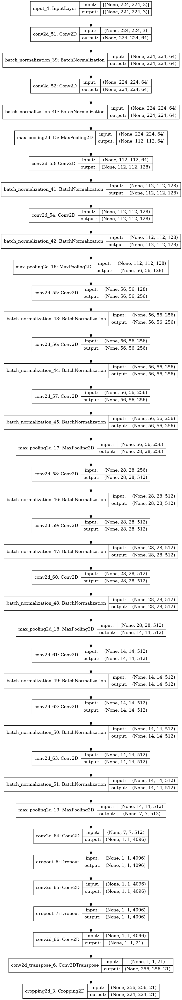

In [34]:
utils.plot_model(fcn32_valid, show_shapes = True)

### FCN 16s valid

In [35]:
def build_fcn16_valid(input_shape = (224,224,3)):
    inputs = Input(input_shape)
    
    filters = [64, 128, 256, 512, 4096, NUM_CLASSES]
    
    block1 = ccm(filters[0], inputs)
    block2 = ccm(filters[1], block1)
    block3 = cccm(filters[2], block2)
    block4 = cccm(filters[3], block3)
    block5 = cccm(filters[3], block4)
    
    fc1 = Conv2D(filters[4], kernel_size =7, activation ='relu', padding ='valid', kernel_initializer='he_normal')(block5)
    fc1 = Dropout(0.5)(fc1)
    
    fc2 = Conv2D(filters[4], kernel_size =1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(fc1)
    fc2 = Dropout(0.5)(fc2)
    
    fc3 = Conv2D(filters[5], kernel_size =1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(fc2)
    up_fc3 = Conv2DTranspose(filters[5], kernel_size = 4, strides = 2)(fc3)
    
    conv_block4 = Conv2D(filters[5], kernel_size = 1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(block4)
    crop_block4 = Cropping2D(cropping = (5,5))(conv_block4)
    
    sum_fc3_block4 = Add()([up_fc3, crop_block4])
    
    up = Conv2DTranspose(filters[5], kernel_size = 128, strides = 32, padding = 'valid')(sum_fc3_block4) 
    #softmax = Activation('softmax')(up)
    
    outputs = up
    
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [36]:
fcn16_valid = build_fcn16_valid()
fcn16_valid.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_67 (Conv2D)              (None, 224, 224, 64) 1792        input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_52 (BatchNo (None, 224, 224, 64) 256         conv2d_67[0][0]                  
__________________________________________________________________________________________________
conv2d_68 (Conv2D)              (None, 224, 224, 64) 36928       batch_normalization_52[0][0]     
____________________________________________________________________________________________

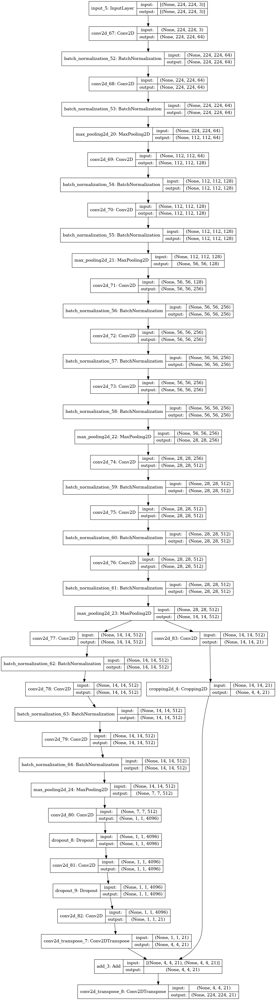

In [37]:
utils.plot_model(fcn16_valid, show_shapes = True)

### FCN 8s valid

In [38]:
def build_fcn8_valid(input_shape = (224,224,3)):
    inputs = Input(input_shape)
    
    filters = [64, 128, 256, 512, 4096, NUM_CLASSES]
    
    block1 = ccm(filters[0], inputs)
    block2 = ccm(filters[1], block1)
    block3 = cccm(filters[2], block2)
    block4 = cccm(filters[3], block3)
    block5 = cccm(filters[3], block4)
    
    fc1 = Conv2D(filters[4], kernel_size =7, activation ='relu', padding ='valid', kernel_initializer='he_normal')(block5)
    fc1 = Dropout(0.5)(fc1)
    
    fc2 = Conv2D(filters[4], kernel_size =1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(fc1)
    fc2 = Dropout(0.5)(fc2)
    
    fc3 = Conv2D(filters[5], kernel_size =1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(fc2)
    up_fc3 = Conv2DTranspose(filters[5], kernel_size = 4, strides = 2)(fc3)  
    
    conv_block4 = Conv2D(filters[5], kernel_size = 1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(block4)
    crop_block4 = Cropping2D(cropping = (5,5))(conv_block4)
    
    sum_fc3_block4 = Add()([up_fc3, crop_block4])
    
    up_sum = Conv2DTranspose(filters[5], kernel_size = 4, strides = 2, padding = 'valid')(sum_fc3_block4)  
    
    conv_block3 = Conv2D(filters[5], kernel_size = 1, activation ='relu', padding ='valid', kernel_initializer='he_normal')(block3)
    crop_block3 = Cropping2D(cropping = (9,9))(conv_block3)
    
    sum_up_block3 = Add()([up_sum, crop_block3])
    
    up = Conv2DTranspose(filters[5], kernel_size = 128, strides = 16, padding = 'valid')(sum_up_block3) 
    crop = Cropping2D(cropping = (24,24))(up)
    #softmax = Activation('softmax')(crop)
    
    outputs = crop
    
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [39]:
fcn8_valid = build_fcn8_valid()
fcn8_valid.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_84 (Conv2D)              (None, 224, 224, 64) 1792        input_6[0][0]                    
__________________________________________________________________________________________________
batch_normalization_65 (BatchNo (None, 224, 224, 64) 256         conv2d_84[0][0]                  
__________________________________________________________________________________________________
conv2d_85 (Conv2D)              (None, 224, 224, 64) 36928       batch_normalization_65[0][0]     
____________________________________________________________________________________________

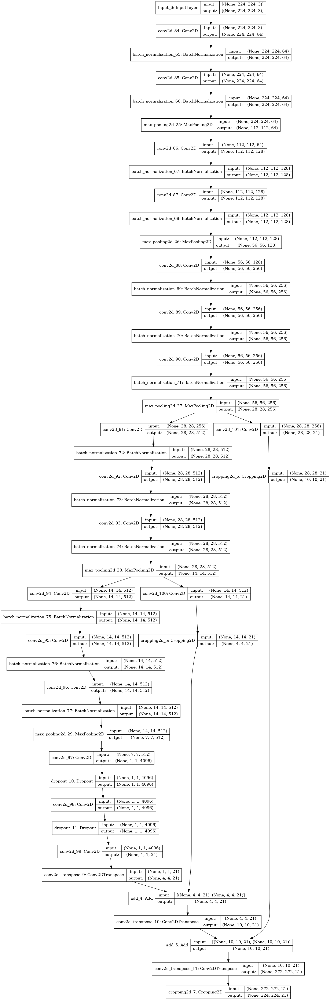

In [40]:
utils.plot_model(fcn8_valid, show_shapes = True)

## fcn8_valid

In [35]:
EPOCHS = 50
VAL_SUBSPLITS = 5
VALIDATION_STEPS = val_size//BATCH_SIZE//VAL_SUBSPLITS

In [42]:

callbacks = keras.callbacks.ModelCheckpoint(
    filepath = './data/fcn8_valid_50.h5',
    save_best_only = True,
    save_weights_only = False,
    monitor = 'val_accuracy',
    mode = 'max',
    verbose = 1
)


In [44]:
fcn8_valid.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  optimizer = keras.optimizers.Adam(),
                   metrics=['accuracy'])

fcn8_valid_history = fcn8_valid.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,
                           callbacks = [callbacks]
                            )

Epoch 1/50
127/127 [==============================] - 79s 608ms/step - loss: 0.4437 - accuracy: 0.8754 - val_loss: 1.4362 - val_accuracy: 0.7981

Epoch 00001: val_accuracy did not improve from 0.89395
Epoch 2/50
127/127 [==============================] - 77s 605ms/step - loss: 0.4353 - accuracy: 0.8763 - val_loss: 0.4458 - val_accuracy: 0.8701

Epoch 00002: val_accuracy did not improve from 0.89395
Epoch 3/50
127/127 [==============================] - 77s 603ms/step - loss: 0.4342 - accuracy: 0.8755 - val_loss: 0.5364 - val_accuracy: 0.8554

Epoch 00003: val_accuracy did not improve from 0.89395
Epoch 4/50
127/127 [==============================] - 77s 604ms/step - loss: 0.4333 - accuracy: 0.8764 - val_loss: 0.4653 - val_accuracy: 0.8479

Epoch 00004: val_accuracy did not improve from 0.89395
Epoch 5/50
127/127 [==============================] - 77s 603ms/step - loss: 0.4227 - accuracy: 0.8786 - val_loss: 0.4338 - val_accuracy: 0.8578

Epoch 00005: val_accuracy did not improve from 0.8

In [47]:
import json
# Convert History object to a dictionary
history_dict = fcn8_valid_history.history

# Save the dictionary to a JSON file
with open("fcn8_valid_history_50.json", 'w') as json_file:
    json.dump(history_dict, json_file)

## fcn16_valid

In [61]:
callbacks = keras.callbacks.ModelCheckpoint(
    filepath = './data/fcn16_valid_50.h5',
    save_best_only = True,
    save_weights_only = False,
    monitor = 'val_accuracy',
    mode = 'max',
    verbose = 1
)


In [63]:
fcn16_valid.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                    optimizer = keras.optimizers.Adam(),
                    metrics=['accuracy'])

fcn16_valid_history = fcn16_valid.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,
                          callbacks = [callbacks]
                                     )

Epoch 1/50
127/127 [==============================] - 70s 540ms/step - loss: 0.5015 - accuracy: 0.8705 - val_loss: 0.7253 - val_accuracy: 0.8384

Epoch 00001: val_accuracy improved from -inf to 0.83838, saving model to ./data/fcn16_valid_50.h5
Epoch 2/50
127/127 [==============================] - 77s 539ms/step - loss: 0.4448 - accuracy: 0.8758 - val_loss: 0.4329 - val_accuracy: 0.8781

Epoch 00002: val_accuracy improved from 0.83838 to 0.87806, saving model to ./data/fcn16_valid_50.h5
Epoch 3/50
127/127 [==============================] - 68s 537ms/step - loss: 0.4385 - accuracy: 0.8768 - val_loss: 0.4104 - val_accuracy: 0.8857

Epoch 00003: val_accuracy improved from 0.87806 to 0.88572, saving model to ./data/fcn16_valid_50.h5
Epoch 4/50
127/127 [==============================] - 68s 536ms/step - loss: 0.4357 - accuracy: 0.8770 - val_loss: 0.3978 - val_accuracy: 0.8865

Epoch 00004: val_accuracy improved from 0.88572 to 0.88651, saving model to ./data/fcn16_valid_50.h5
Epoch 5/50
127/


Epoch 00039: val_accuracy did not improve from 0.91372
Epoch 40/50
127/127 [==============================] - 68s 536ms/step - loss: 0.3316 - accuracy: 0.8906 - val_loss: 0.4124 - val_accuracy: 0.8776

Epoch 00040: val_accuracy did not improve from 0.91372
Epoch 41/50
127/127 [==============================] - 68s 535ms/step - loss: 0.3351 - accuracy: 0.8887 - val_loss: 0.4568 - val_accuracy: 0.8644

Epoch 00041: val_accuracy did not improve from 0.91372
Epoch 42/50
127/127 [==============================] - 68s 535ms/step - loss: 0.3266 - accuracy: 0.8926 - val_loss: 0.4818 - val_accuracy: 0.8674

Epoch 00042: val_accuracy did not improve from 0.91372
Epoch 43/50
127/127 [==============================] - 68s 536ms/step - loss: 0.3277 - accuracy: 0.8916 - val_loss: 0.4359 - val_accuracy: 0.8680

Epoch 00043: val_accuracy did not improve from 0.91372
Epoch 44/50
127/127 [==============================] - 68s 536ms/step - loss: 0.3206 - accuracy: 0.8932 - val_loss: 0.4265 - val_accurac

In [64]:
import json
# Convert History object to a dictionary
history_dict = fcn16_valid_history.history

# Save the dictionary to a JSON file
with open("fcn16_valid_history_50.json", 'w') as json_file:
    json.dump(history_dict, json_file)

## fcn32_valid

In [68]:
callbacks = keras.callbacks.ModelCheckpoint(
    filepath = './data/fcn32_valid_50.h5',
    save_best_only = True,
    save_weights_only = False,
    monitor = 'val_accuracy',
    mode = 'max',
    verbose = 1
)

In [69]:
fcn32_valid.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                    optimizer = keras.optimizers.Adam(),
                    metrics=['accuracy'])

fcn32_valid_history = fcn32_valid.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,
                            callbacks = [callbacks])

Epoch 1/50
127/127 [==============================] - 178s 670ms/step - loss: 0.5825 - accuracy: 0.8617 - val_loss: 1.0750 - val_accuracy: 0.8668

Epoch 00001: val_accuracy improved from -inf to 0.86681, saving model to ./data/fcn32_valid_50.h5
Epoch 2/50
127/127 [==============================] - 125s 668ms/step - loss: 0.4702 - accuracy: 0.8784 - val_loss: 0.5334 - val_accuracy: 0.8962

Epoch 00002: val_accuracy improved from 0.86681 to 0.89622, saving model to ./data/fcn32_valid_50.h5
Epoch 3/50
127/127 [==============================] - 85s 667ms/step - loss: 0.4653 - accuracy: 0.8784 - val_loss: 0.4393 - val_accuracy: 0.8924

Epoch 00003: val_accuracy did not improve from 0.89622
Epoch 4/50
127/127 [==============================] - 85s 666ms/step - loss: 0.4618 - accuracy: 0.8782 - val_loss: 0.4510 - val_accuracy: 0.9053

Epoch 00004: val_accuracy improved from 0.89622 to 0.90531, saving model to ./data/fcn32_valid_50.h5
Epoch 5/50
127/127 [==============================] - 85s 6

127/127 [==============================] - 85s 666ms/step - loss: 0.4065 - accuracy: 0.8812 - val_loss: 0.3981 - val_accuracy: 0.8864

Epoch 00041: val_accuracy did not improve from 0.90531
Epoch 42/50
127/127 [==============================] - 85s 666ms/step - loss: 0.4188 - accuracy: 0.8764 - val_loss: 0.4591 - val_accuracy: 0.8694

Epoch 00042: val_accuracy did not improve from 0.90531
Epoch 43/50
127/127 [==============================] - 85s 666ms/step - loss: 0.4185 - accuracy: 0.8776 - val_loss: 0.5164 - val_accuracy: 0.8561

Epoch 00043: val_accuracy did not improve from 0.90531
Epoch 44/50
127/127 [==============================] - 85s 666ms/step - loss: 0.4035 - accuracy: 0.8830 - val_loss: 0.3721 - val_accuracy: 0.8999

Epoch 00044: val_accuracy did not improve from 0.90531
Epoch 45/50
127/127 [==============================] - 85s 666ms/step - loss: 0.4155 - accuracy: 0.8740 - val_loss: 0.4045 - val_accuracy: 0.8934

Epoch 00045: val_accuracy did not improve from 0.90531
Ep

In [70]:
import json
# Convert History object to a dictionary
history_dict = fcn32_valid_history.history

# Save the dictionary to a JSON file
with open("fcn32_valid_history_50.json", 'w') as json_file:
    json.dump(history_dict, json_file)

## fcn8_same

In [50]:
callbacks8_same = keras.callbacks.ModelCheckpoint(
    filepath = './data/fcn8_same_50.h5',
    save_best_only = True,
    save_weights_only = False,
    monitor = 'val_accuracy',
    mode = 'max',
    verbose = 1
)

In [51]:
fcn8_same.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  optimizer = keras.optimizers.Adam(),
                  metrics=['accuracy'])

fcn8_same_history = fcn8_same.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,
                            callbacks = [callbacks8_same])

NameError: name 'fcn8_same' is not defined

In [78]:
import json
# Convert History object to a dictionary
history_dict = fcn8_same_history.history

# Save the dictionary to a JSON file
with open("fcn8_same_history_50.json", 'w') as json_file:
    json.dump(history_dict, json_file)

## fcn16_same

In [52]:
callbacks16_same = keras.callbacks.ModelCheckpoint(
    filepath = './data/fcn16_same_50.h5',
    save_best_only = True,
    save_weights_only = False,
    monitor = 'val_accuracy',
    mode = 'max',
    verbose = 1
)

In [53]:
fcn16_same.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  optimizer = keras.optimizers.Adam(),
                   metrics=['accuracy'])

fcn16_same_history = fcn16_same.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,
                            callbacks = [callbacks16_same])

Epoch 1/50
127/127 [==============================] - 77s 595ms/step - loss: 0.6733 - accuracy: 0.8335 - val_loss: 0.6599 - val_accuracy: 0.8876

Epoch 00001: val_accuracy improved from -inf to 0.88759, saving model to ./data/fcn16_same_50.h5


/opt/conda/lib/python3.9/site-packages/keras/utils/generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
127/127 [==============================] - 78s 610ms/step - loss: 0.4138 - accuracy: 0.8821 - val_loss: 0.4574 - val_accuracy: 0.8620

Epoch 00002: val_accuracy did not improve from 0.88759
Epoch 3/50
127/127 [==============================] - 78s 613ms/step - loss: 0.4060 - accuracy: 0.8838 - val_loss: 0.4180 - val_accuracy: 0.8753

Epoch 00003: val_accuracy did not improve from 0.88759
Epoch 4/50
127/127 [==============================] - 78s 614ms/step - loss: 0.4045 - accuracy: 0.8820 - val_loss: 0.3671 - val_accuracy: 0.9004

Epoch 00004: val_accuracy improved from 0.88759 to 0.90038, saving model to ./data/fcn16_same_50.h5
Epoch 5/50
127/127 [==============================] - 78s 616ms/step - loss: 0.4040 - accuracy: 0.8818 - val_loss: 0.4308 - val_accuracy: 0.8784

Epoch 00005: val_accuracy did not improve from 0.90038
Epoch 6/50
127/127 [==============================] - 78s 614ms/step - loss: 0.3996 - accuracy: 0.8827 - val_loss: 0.3553 - val_accuracy: 0.8998

Epoch


Epoch 00041: val_accuracy did not improve from 0.90718
Epoch 42/50
127/127 [==============================] - 78s 613ms/step - loss: 0.3485 - accuracy: 0.8819 - val_loss: 0.3704 - val_accuracy: 0.8812

Epoch 00042: val_accuracy did not improve from 0.90718
Epoch 43/50
127/127 [==============================] - 78s 613ms/step - loss: 0.3384 - accuracy: 0.8865 - val_loss: 0.3837 - val_accuracy: 0.8845

Epoch 00043: val_accuracy did not improve from 0.90718
Epoch 44/50
127/127 [==============================] - 78s 613ms/step - loss: 0.3292 - accuracy: 0.8877 - val_loss: 0.4401 - val_accuracy: 0.8585

Epoch 00044: val_accuracy did not improve from 0.90718
Epoch 45/50
127/127 [==============================] - 78s 613ms/step - loss: 0.3382 - accuracy: 0.8825 - val_loss: 0.4327 - val_accuracy: 0.8511

Epoch 00045: val_accuracy did not improve from 0.90718
Epoch 46/50
127/127 [==============================] - 78s 612ms/step - loss: 0.3208 - accuracy: 0.8904 - val_loss: 0.3360 - val_accurac

In [54]:
import json
# Convert History object to a dictionary
history_dict = fcn16_same_history.history

# Save the dictionary to a JSON file
with open("fcn16_same_history_50.json", 'w') as json_file:
    json.dump(history_dict, json_file)

## fcn32_same

In [36]:
callbacks32_same = keras.callbacks.ModelCheckpoint(
    filepath = './data/fcn32_same_50.h5',
    save_best_only = True,
    save_weights_only = False,
    monitor = 'val_accuracy',
    mode = 'max',
    verbose = 1
)

In [37]:
fcn32_same.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  optimizer = keras.optimizers.Adam(),
                   metrics=['accuracy'])

fcn32_same_history = fcn32_same.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,
                            callbacks = [callbacks32_same])

Epoch 1/50
127/127 [==============================] - 95s 613ms/step - loss: 0.5938 - accuracy: 0.8537 - val_loss: 0.4348 - val_accuracy: 0.8843

Epoch 00001: val_accuracy improved from -inf to 0.88427, saving model to ./data/fcn32_same_50.h5
Epoch 2/50
127/127 [==============================] - 85s 626ms/step - loss: 0.4600 - accuracy: 0.8819 - val_loss: 0.4100 - val_accuracy: 0.8912

Epoch 00002: val_accuracy improved from 0.88427 to 0.89120, saving model to ./data/fcn32_same_50.h5
Epoch 3/50
127/127 [==============================] - 79s 623ms/step - loss: 0.4313 - accuracy: 0.8830 - val_loss: 0.4011 - val_accuracy: 0.8949

Epoch 00003: val_accuracy improved from 0.89120 to 0.89489, saving model to ./data/fcn32_same_50.h5
Epoch 4/50
127/127 [==============================] - 79s 623ms/step - loss: 0.4265 - accuracy: 0.8825 - val_loss: 0.3783 - val_accuracy: 0.8974

Epoch 00004: val_accuracy improved from 0.89489 to 0.89741, saving model to ./data/fcn32_same_50.h5
Epoch 5/50
127/127 

127/127 [==============================] - 79s 621ms/step - loss: 0.1475 - accuracy: 0.9536 - val_loss: 0.3663 - val_accuracy: 0.9036

Epoch 00040: val_accuracy did not improve from 0.91418
Epoch 41/50
127/127 [==============================] - 79s 622ms/step - loss: 0.1462 - accuracy: 0.9533 - val_loss: 0.4352 - val_accuracy: 0.8922

Epoch 00041: val_accuracy did not improve from 0.91418
Epoch 42/50
127/127 [==============================] - 79s 621ms/step - loss: 0.1380 - accuracy: 0.9561 - val_loss: 0.4675 - val_accuracy: 0.8872

Epoch 00042: val_accuracy did not improve from 0.91418
Epoch 43/50
127/127 [==============================] - 79s 621ms/step - loss: 0.1413 - accuracy: 0.9553 - val_loss: 0.5617 - val_accuracy: 0.8794

Epoch 00043: val_accuracy did not improve from 0.91418
Epoch 44/50
127/127 [==============================] - 79s 621ms/step - loss: 0.1343 - accuracy: 0.9575 - val_loss: 0.5603 - val_accuracy: 0.8541

Epoch 00044: val_accuracy did not improve from 0.91418
Ep

In [38]:
import json
# Convert History object to a dictionary
history_dict = fcn32_same_history.history

# Save the dictionary to a JSON file
with open("fcn32_same_history_50.json", 'w') as json_file:
    json.dump(history_dict, json_file)

# display

In [40]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

In [41]:
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [42]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(np.array(display_list[i]))
        plt.axis('off')
    plt.show()

In [45]:
def show_predictions(dataset=None, num=1, model = fcn32_same):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
            create_mask(model.predict(sample_image[tf.newaxis, ...]))])

In [44]:
def draw_history(history, model_name='UNet'):
    plt.subplots(figsize=(10,10))

    # Model Loss, Validation Loss 시각화
    plt.subplot(121)
    plt.plot(history.history['loss'], 'r')
    plt.plot(history.history['val_loss'], 'b')
    plt.title(f'{model_name} Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['loss', 'val_loss'], loc='upper left')

    # Model Accuracy, Validation Accuracy 시각화
    plt.subplot(122)
    plt.plot(history.history['accuracy'], 'r')
    plt.plot(history.history['val_accuracy'], 'b')
    plt.title(f'{model_name} Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['accuracy', 'val_accuracy'], loc='upper left')
    
    plt.tight_layout()
    plt.show()

### fcn8_valid

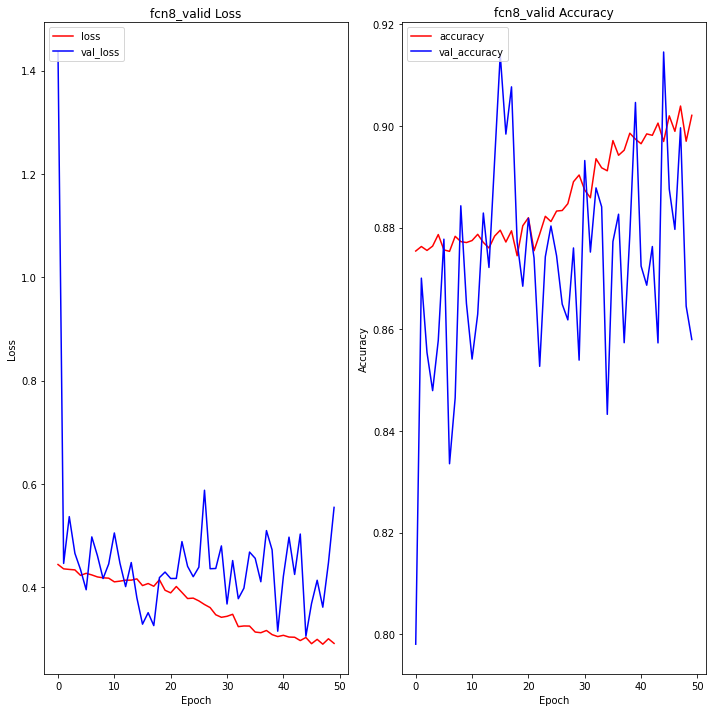

In [54]:
draw_history(fcn8_valid_history, 'fcn8_valid')

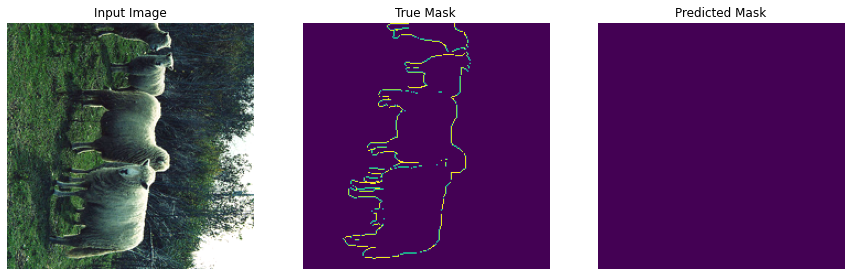

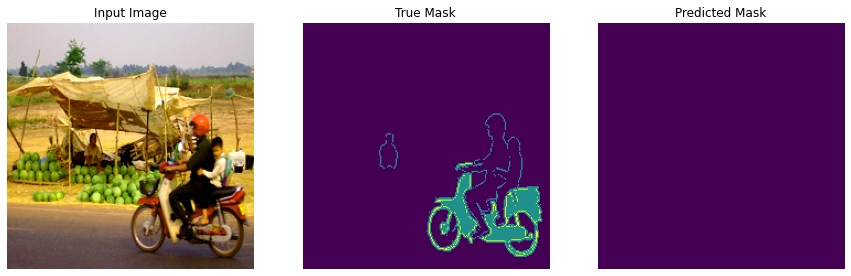

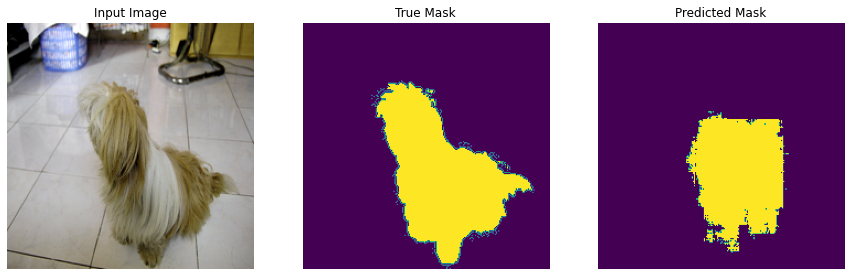

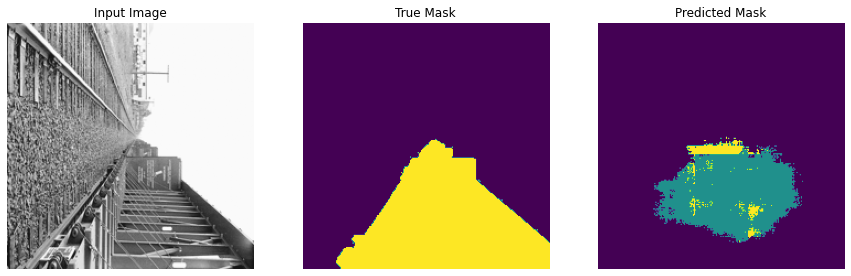

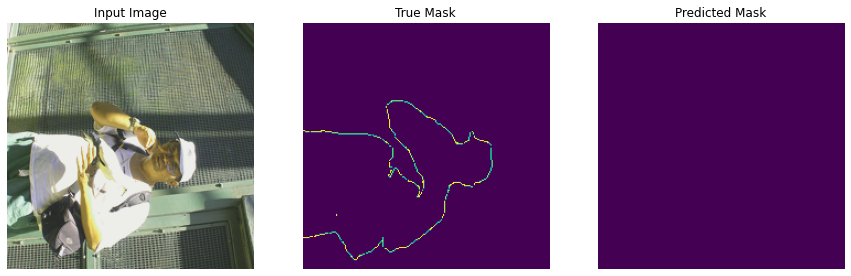

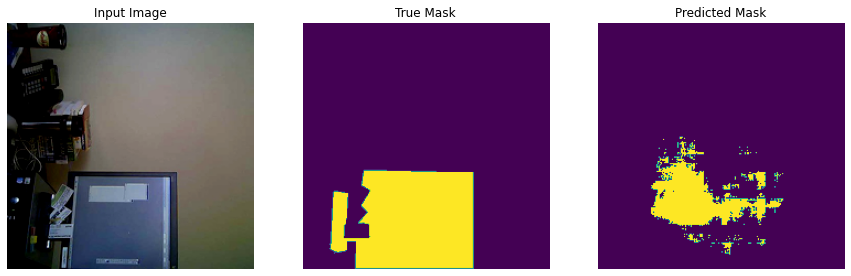

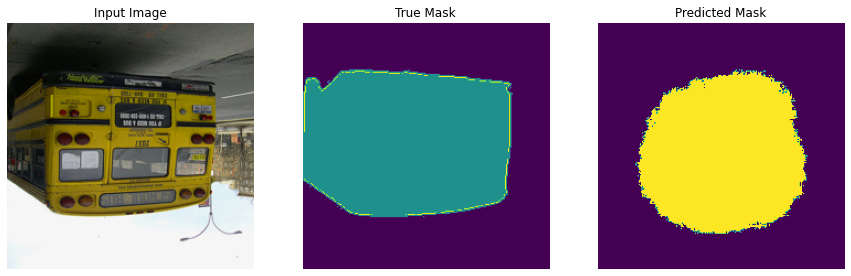

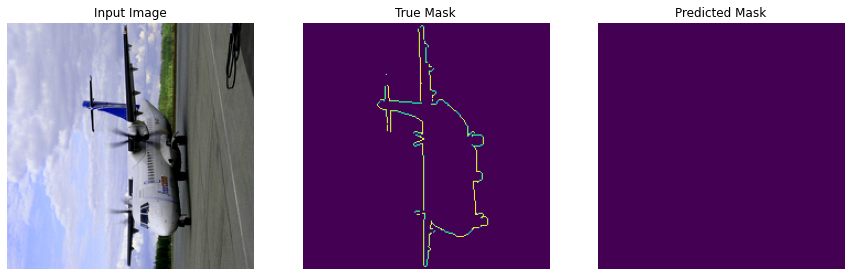

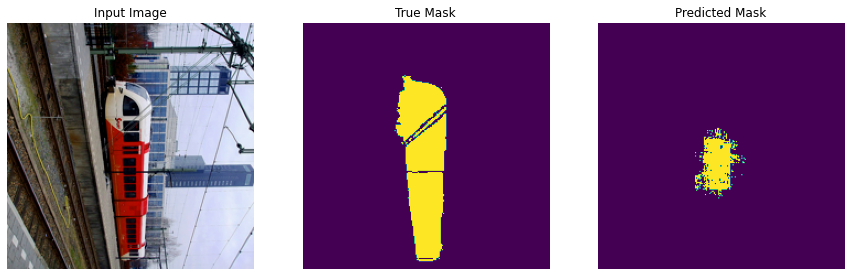

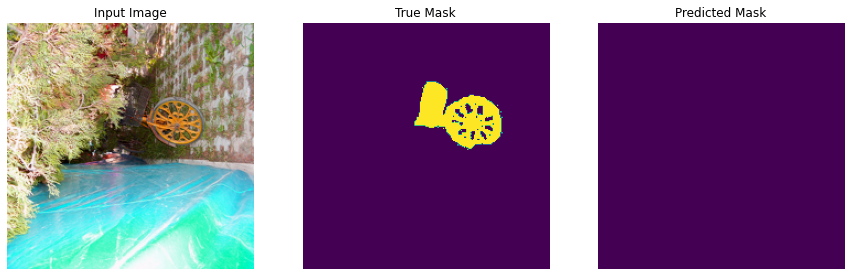

In [59]:
show_predictions(train_dataset, num =10, model = fcn8_valid)

### fcn16_valid

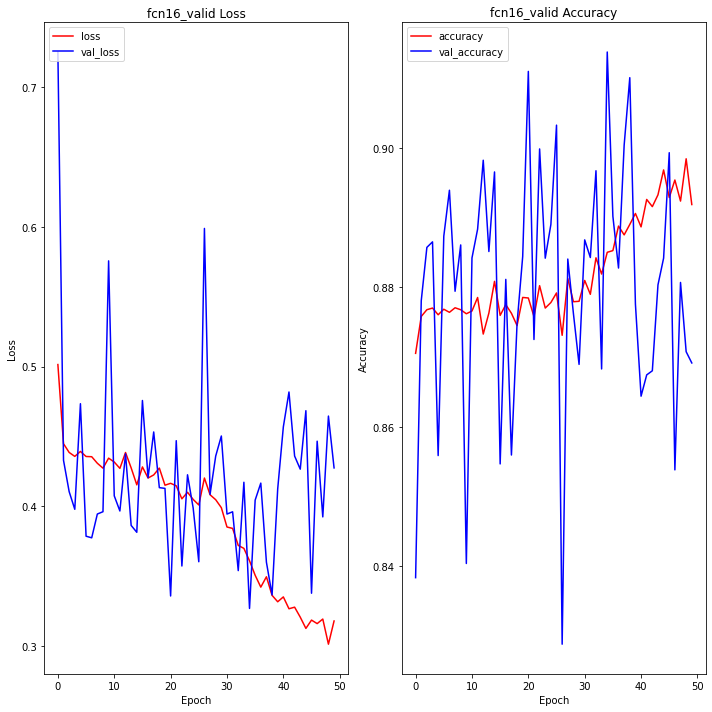

In [65]:
draw_history(fcn16_valid_history, 'fcn16_valid')

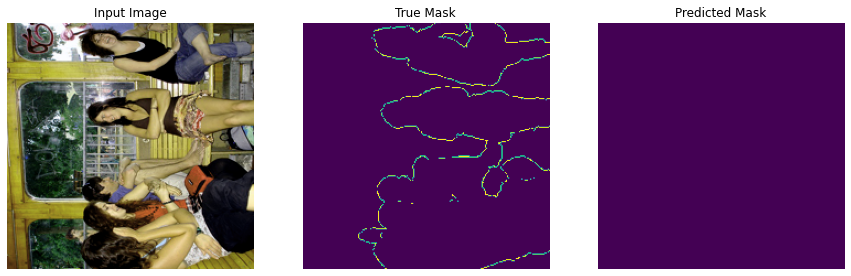

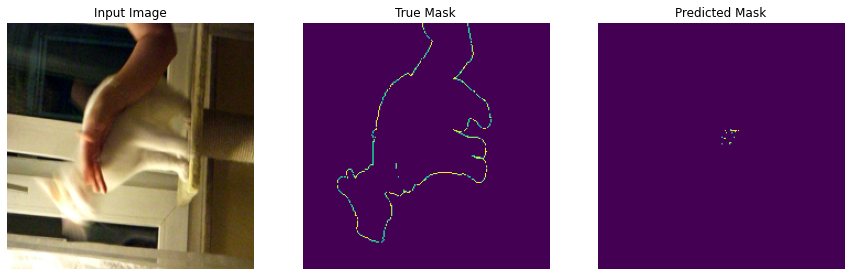

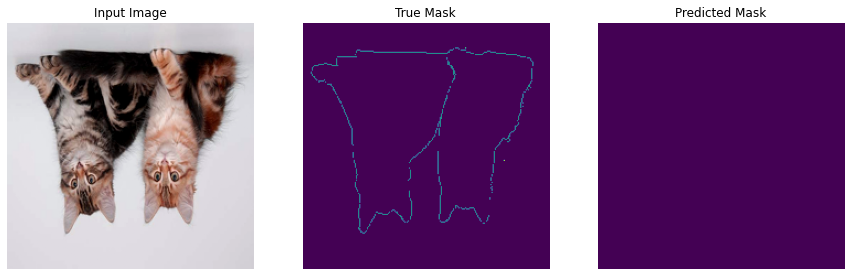

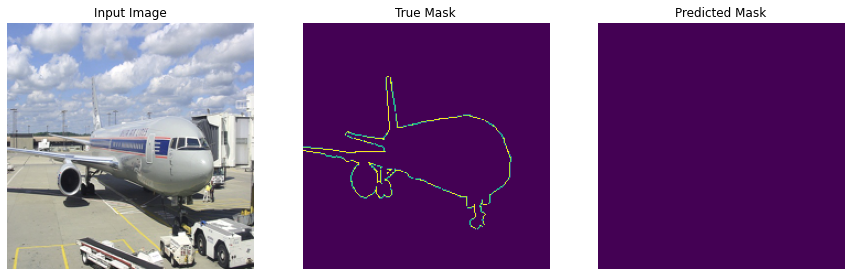

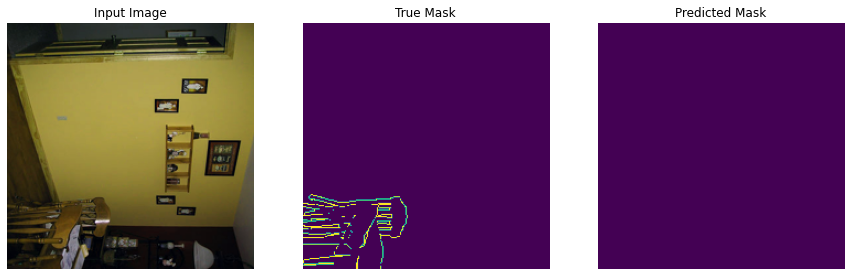

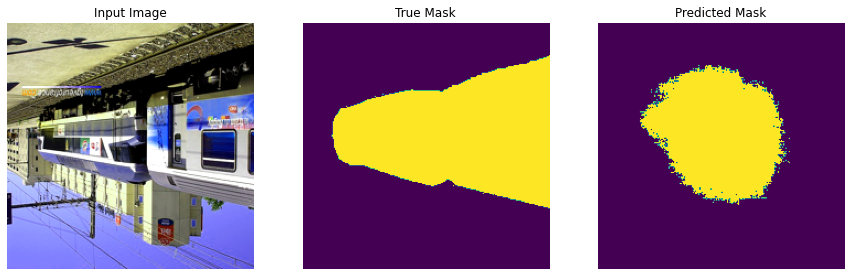

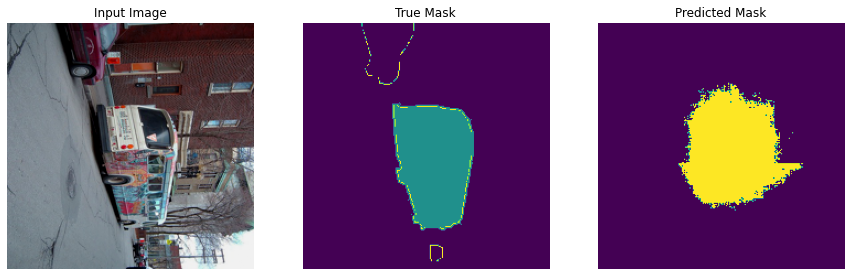

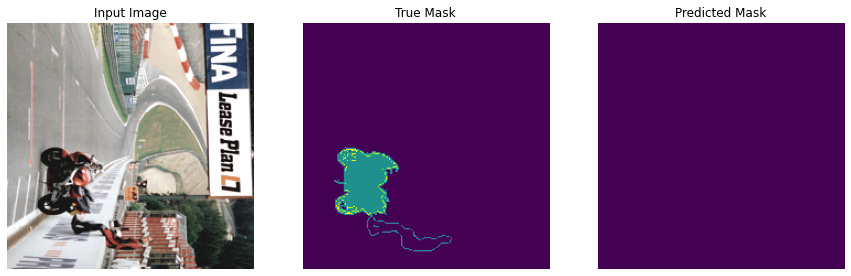

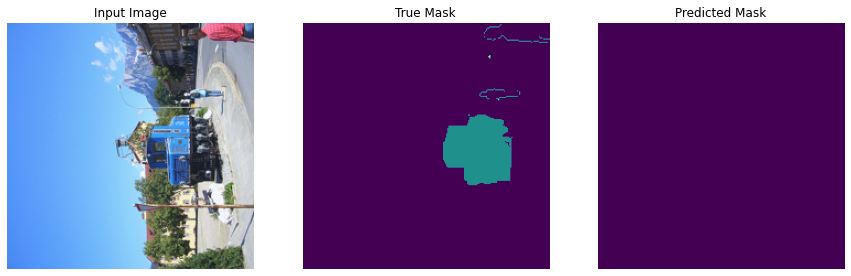

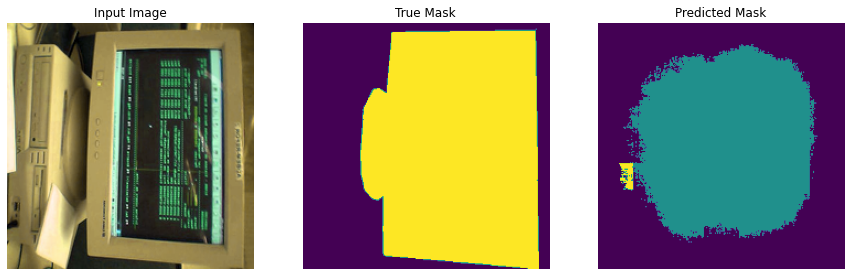

In [66]:
show_predictions(train_dataset, num =10, model = fcn16_valid)

### fcn32_valid

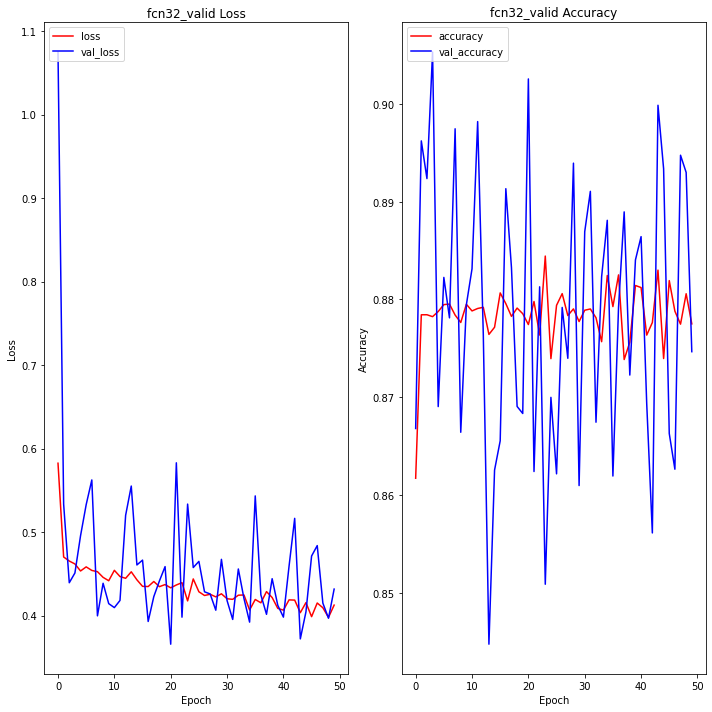

In [71]:
draw_history(fcn32_valid_history, 'fcn32_valid')

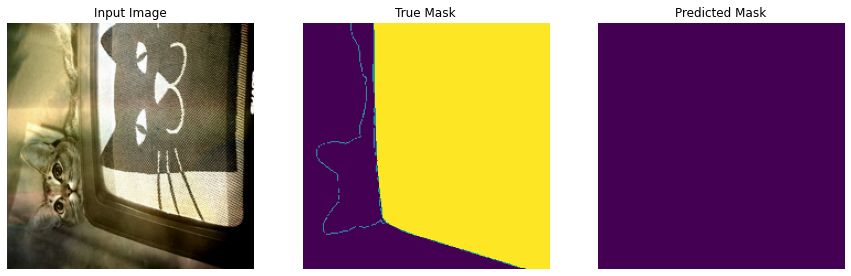

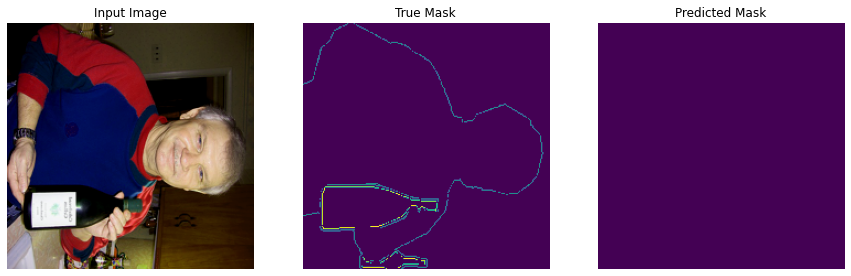

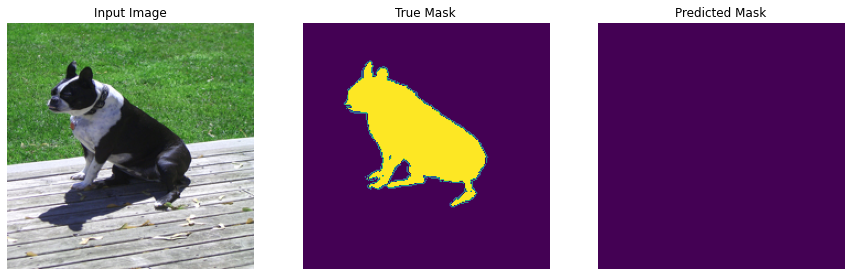

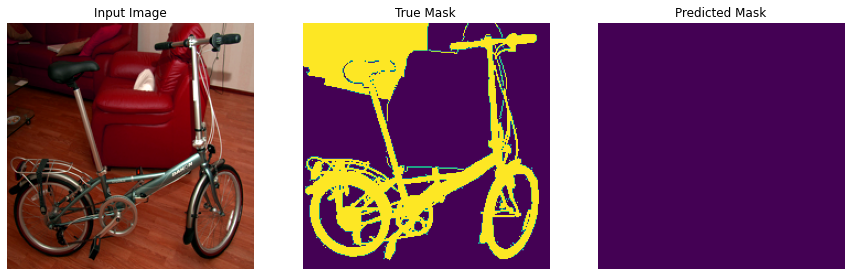

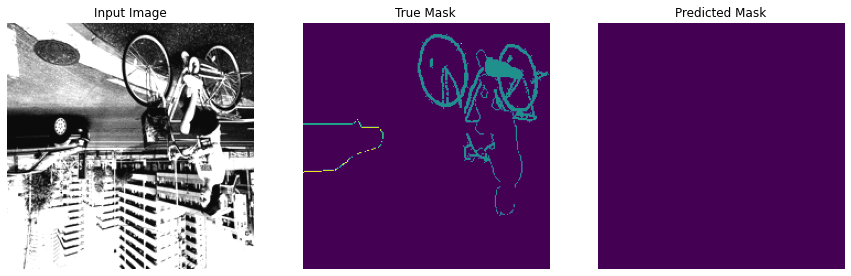

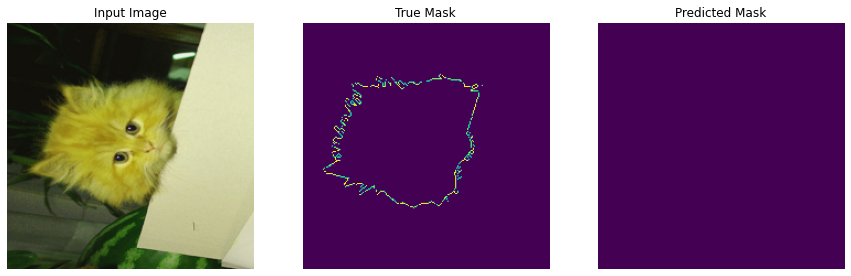

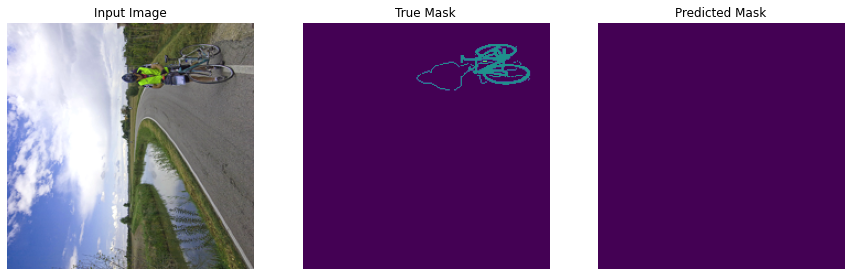

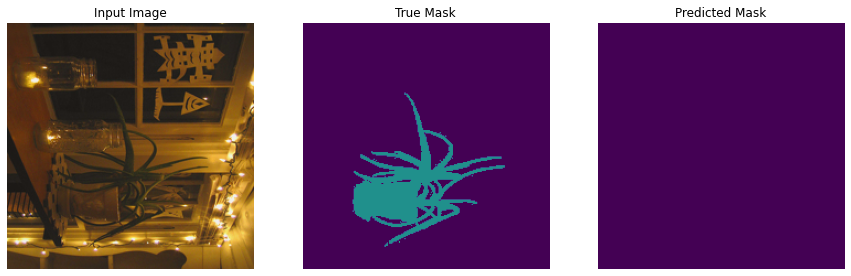

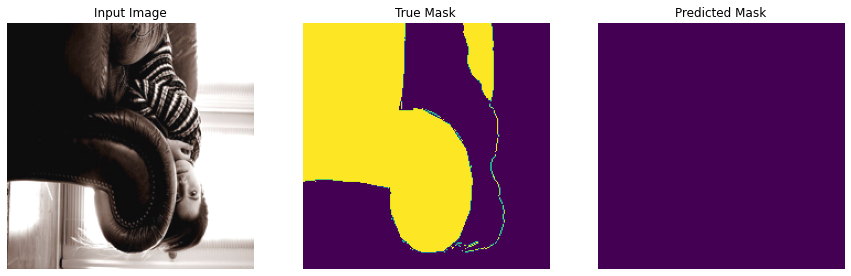

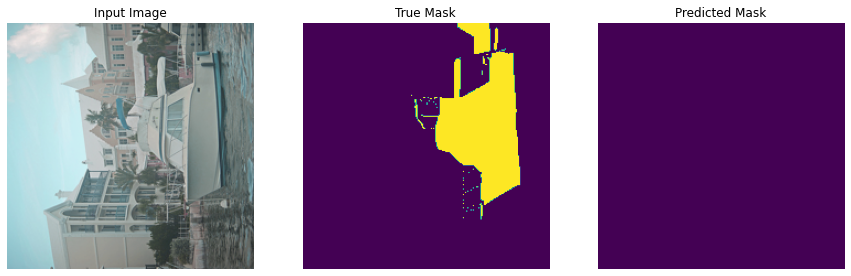

In [74]:
show_predictions(train_dataset, num =10, model = fcn32_valid)

### fcn8_same

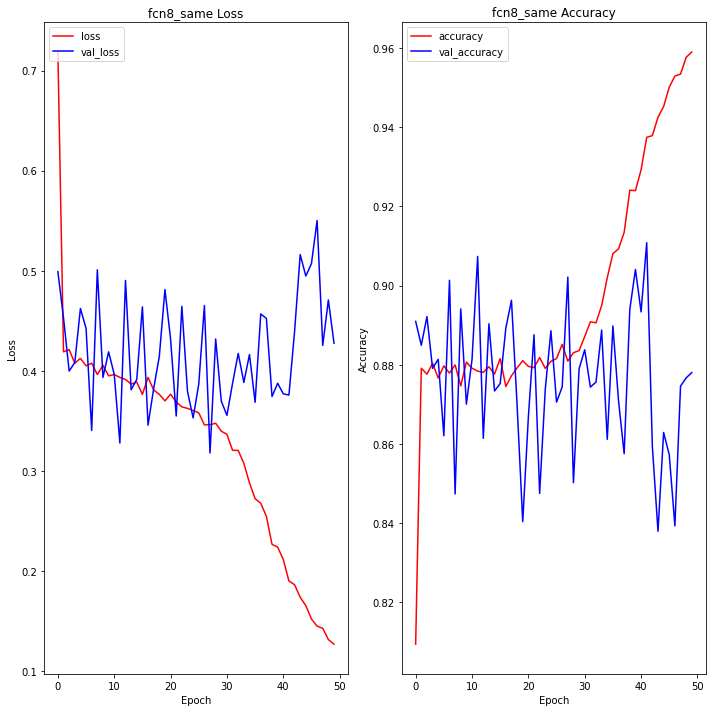

In [79]:
draw_history(fcn8_same_history, 'fcn8_same')

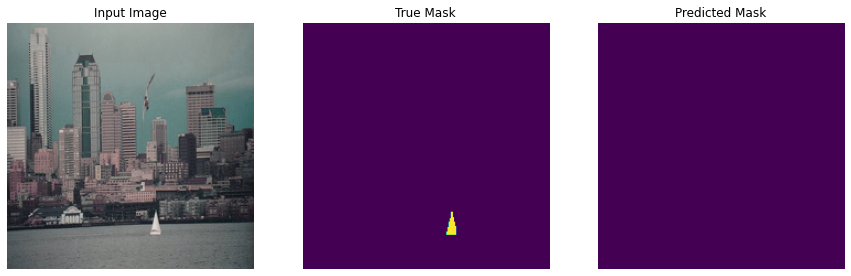

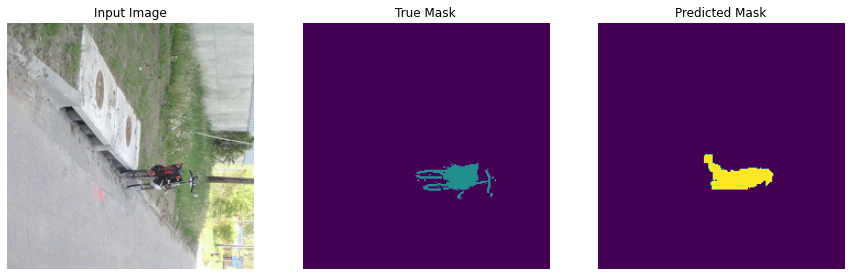

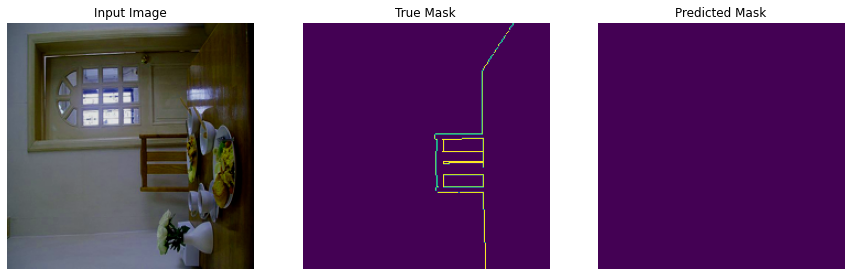

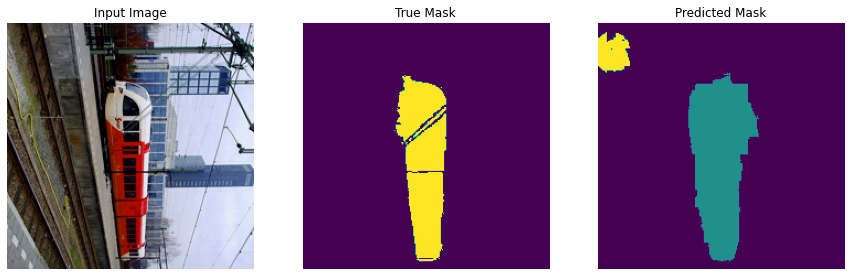

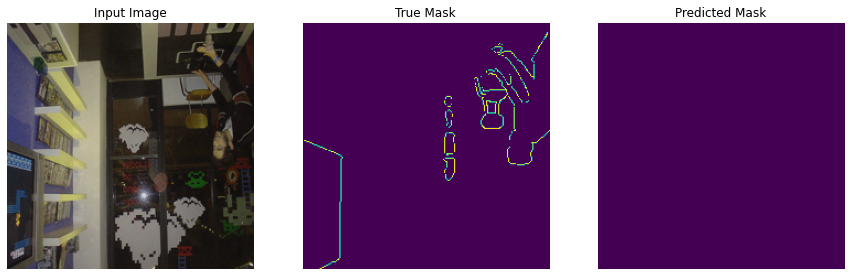

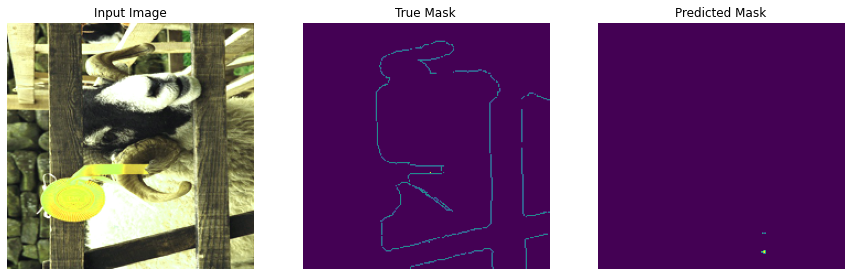

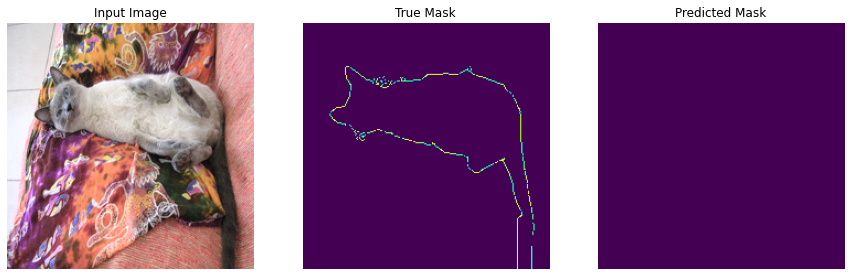

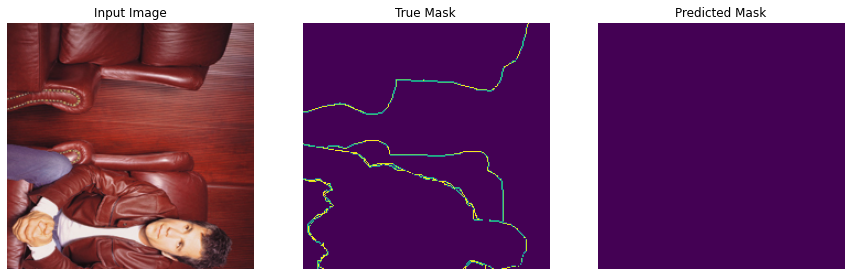

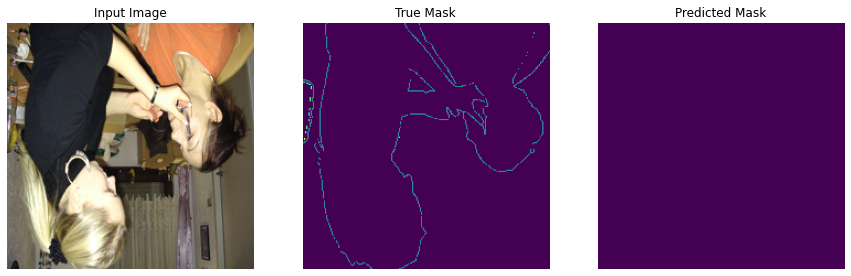

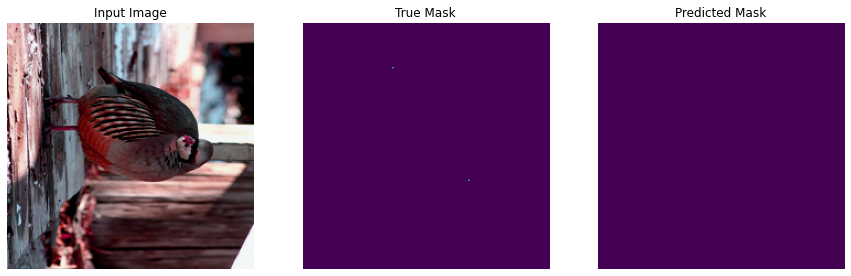

In [81]:
show_predictions(train_dataset, num =10, model = fcn8_same)

### fcn16_same

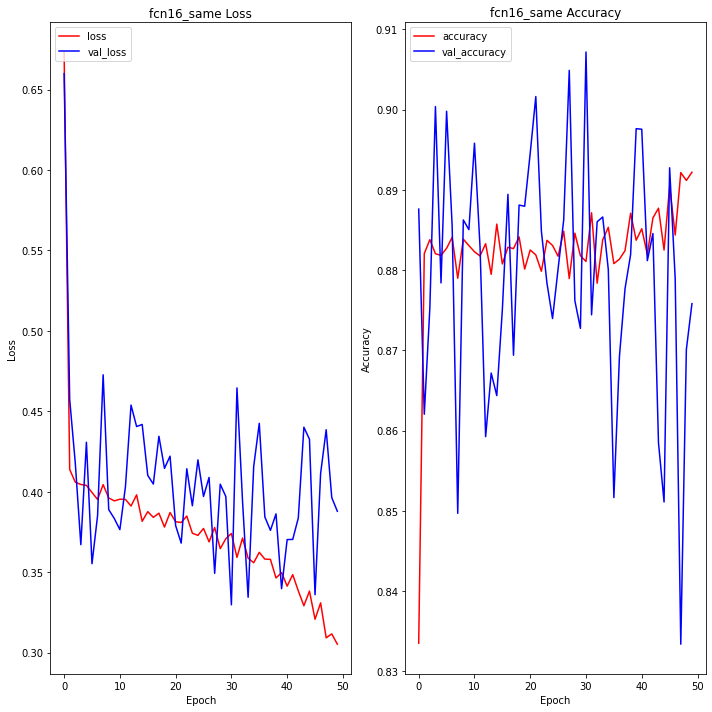

In [55]:
draw_history(fcn16_same_history, 'fcn16_same')

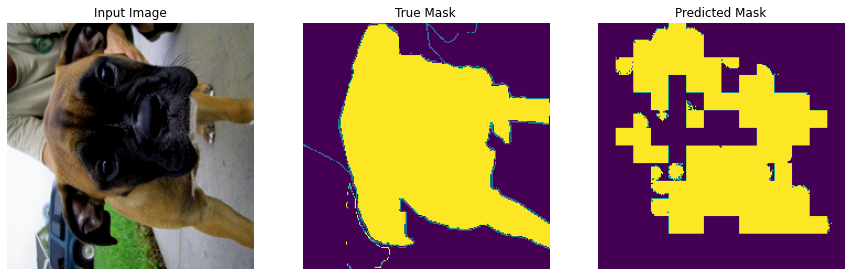

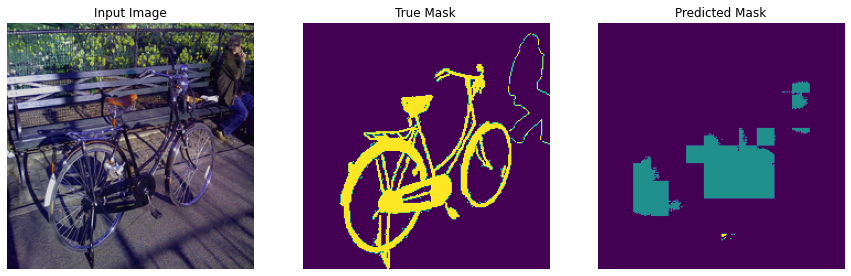

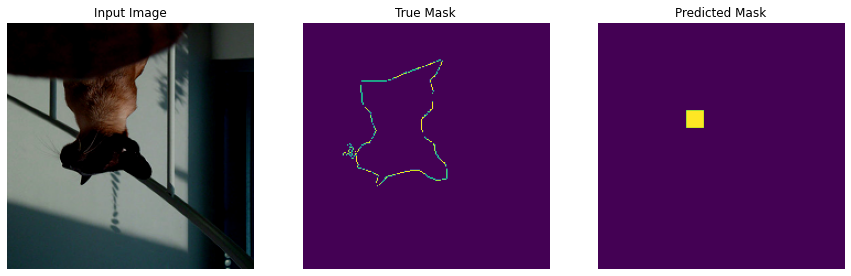

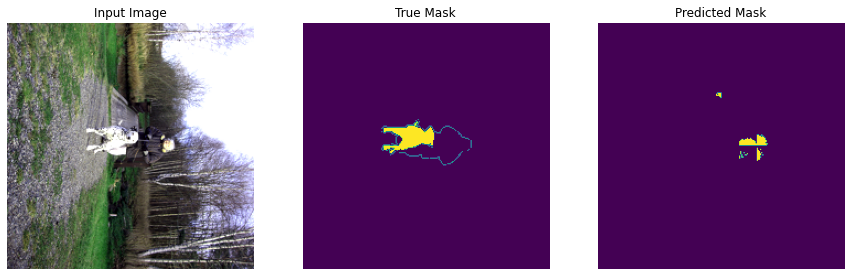

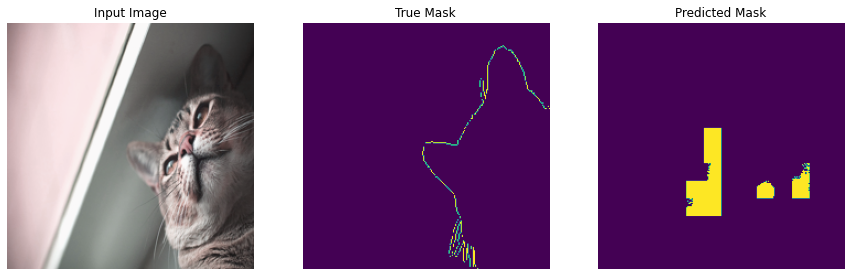

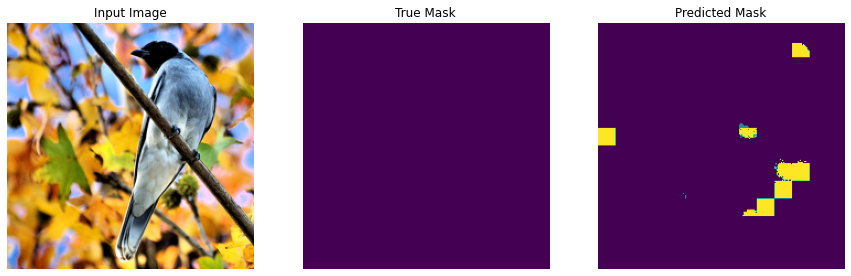

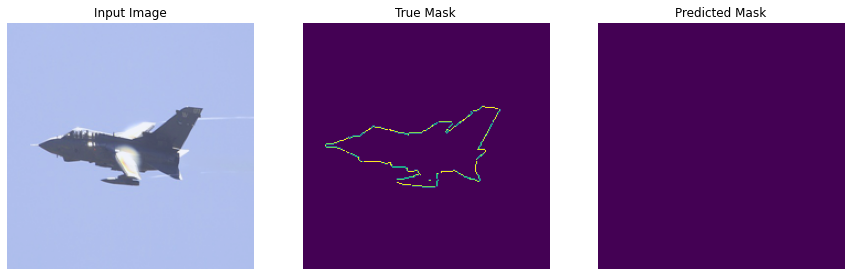

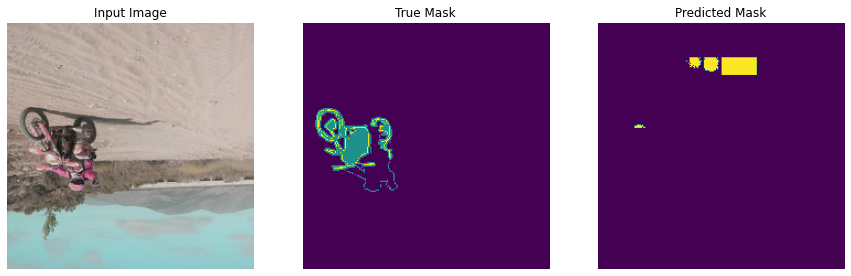

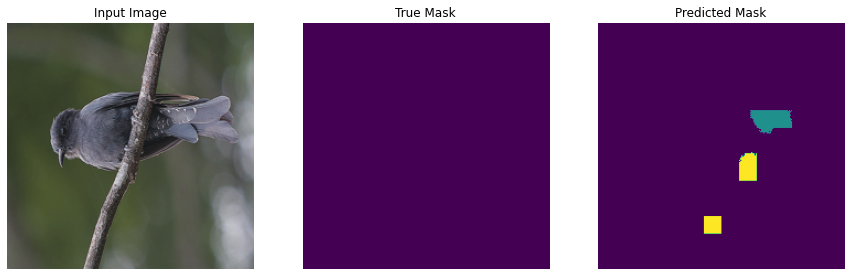

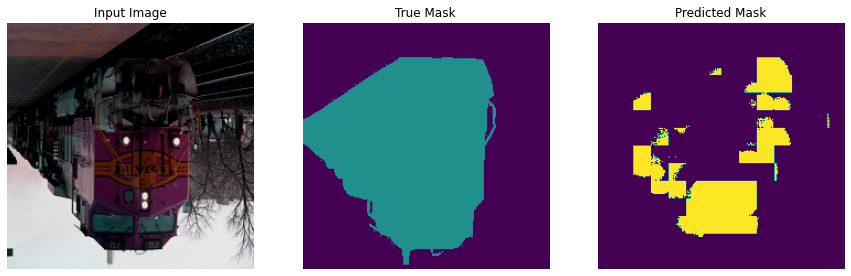

In [56]:
show_predictions(train_dataset, num =10, model = fcn16_same)

### fcn32_same

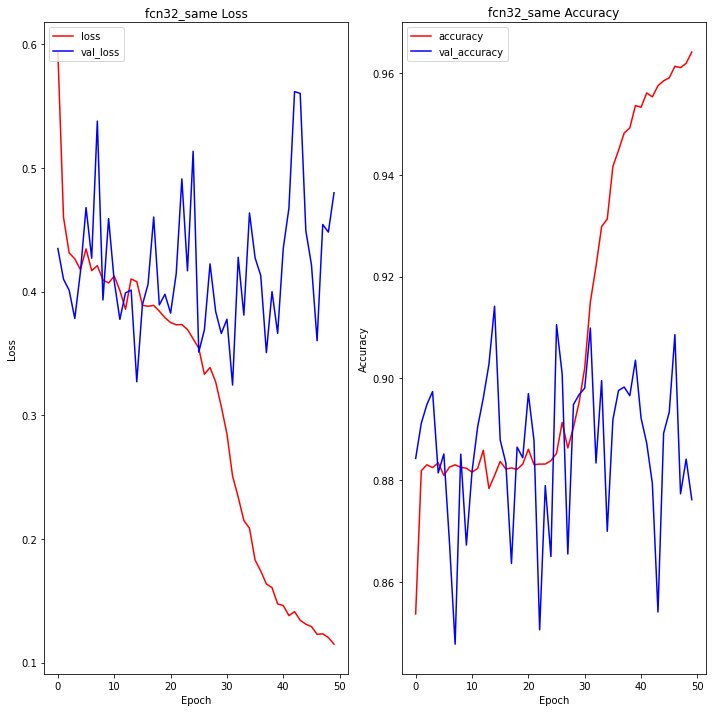

In [46]:
draw_history(fcn32_same_history, 'fcn32_same')

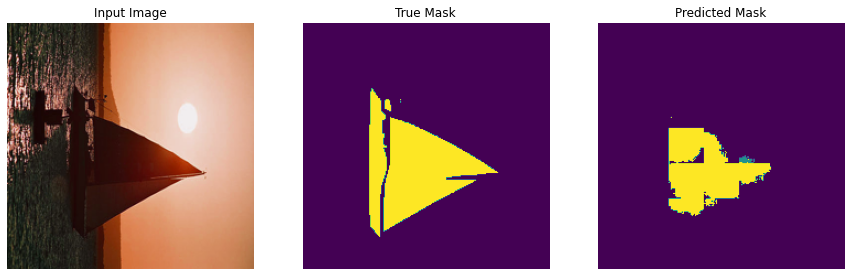

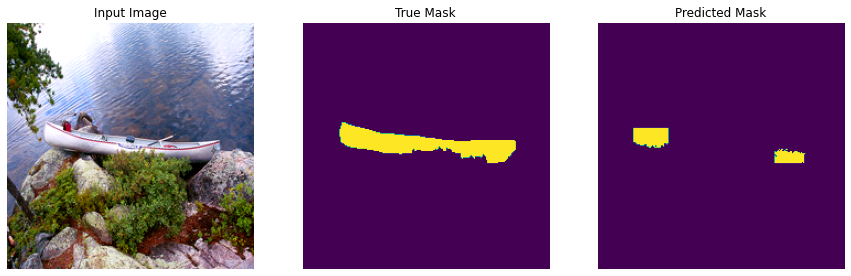

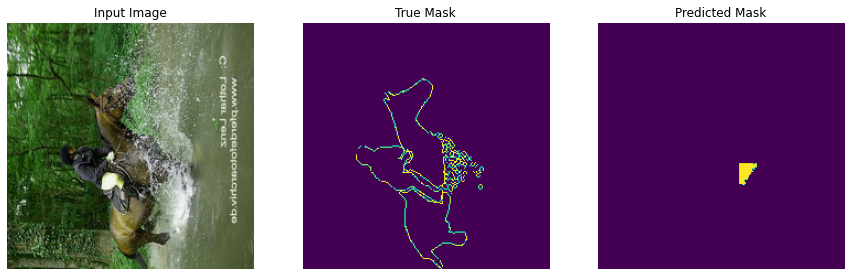

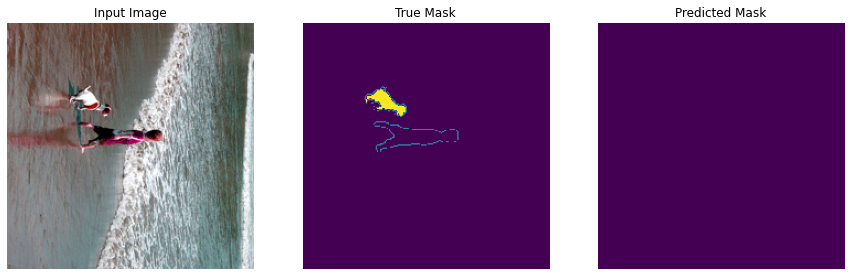

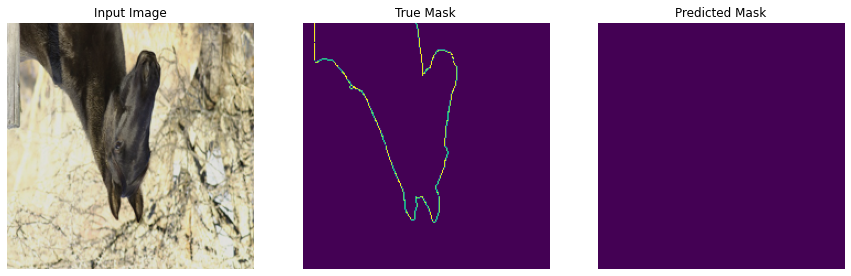

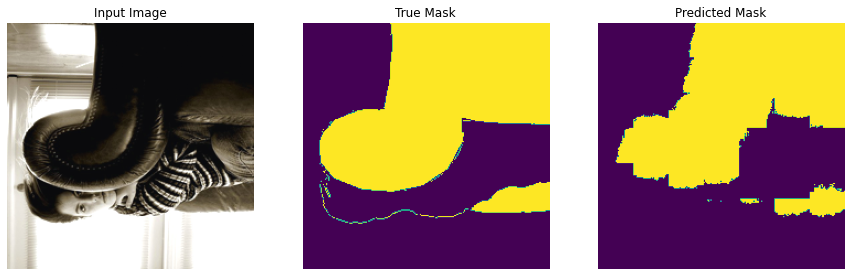

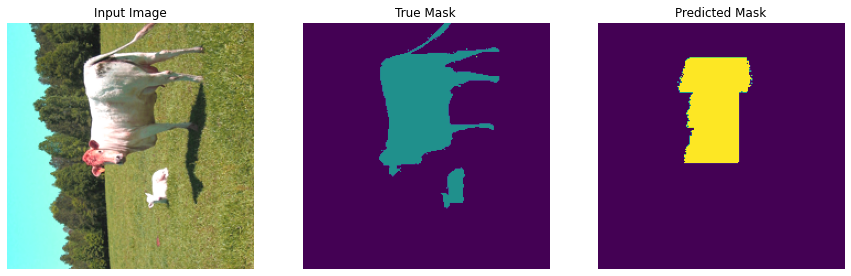

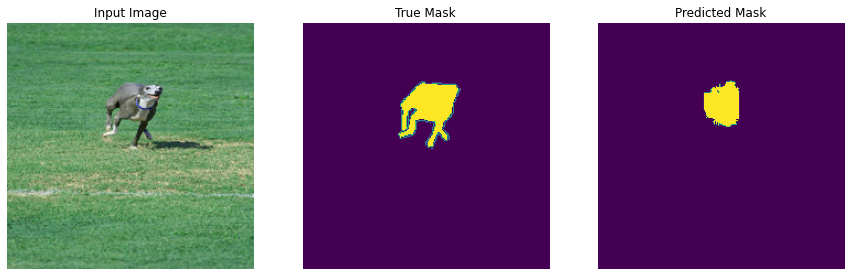

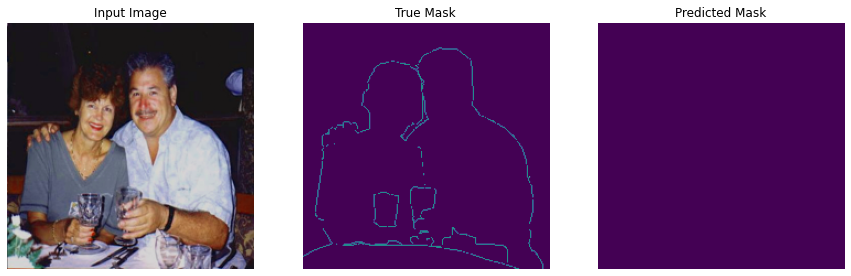

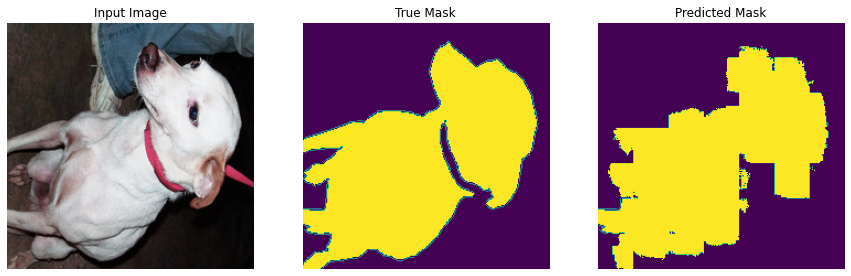

In [49]:
show_predictions(train_dataset, num =10, model = fcn32_same)

In [ ]:
model.evaluate(test_dataset)

In [ ]:
!mkdir source
!mkdir mask

In [ ]:
cnt = 0
for image, mask in train_dataset.take(10):
    pred_mask = model.predict(image)
    pred_mask = create_mask(pred_mask)
    pred_mask = (np.array(pred_mask) != 0).astype(int)

    # 이미지 저장
    source_image = (np.array(image[0]*255)).astype(np.uint8)
    Image.fromarray(source_image).save(f"source/source_{cnt}.jpg")

    # 마스크 저장
    mask_image = (pred_mask[:, :, 0] * 255).astype(np.uint8)
    Image.fromarray(mask_image).save(f"mask/mask_{cnt}.jpg")

    display([image[0], mask_image, image[0] * pred_mask])
    cnt += 1


In [ ]:
wandb.login(key = 'b8794027538b636fadd6ed7977b6becca8d35e31')

In [ ]:
sweep_config = {
    "name": "sweep_test_cv",
    "metric": {"name": "val_loss", "goal": "minimize"},
    "method": "random",
    "parameters": {
        "learning_rate" : {
            "min" : 0.001,
            "max" : 0.1
            },
        "epoch" : {
            "distribution" : "int_uniform",
            "min" : 5,
            "max" : 200
            }

        }
    }

In [ ]:
def train():
    default_config = {
        "input" : (224,224,3),
        "filter" : 8,
        "kernel" : (3,3),
        "learning_rate" : 0.001,
        "optimizer" : "adam",
        "metrics" : ["accuracy"],
        "epoch" : 5,
        "batch_size" : 32
    }

    wandb.init(config = default_config)
    config = wandb.config


    # 머신 러닝 학습때 여러가지 optimzier를 사용할 경우나 learning rate를 조절할 경우에는 아래와 같은 형태의 코드를 응용합니다.

    if config.optimizer == 'adam':
        optimizer = keras.optimizers.Adam(learning_rate = config.learning_rate)

    model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=config.metrics)

    # WandbCallback 함수는 후술합니다.
    model.fit(train_dataset,
              epochs=config.epoch,
              steps_per_epoch=STEPS_PER_EPOCH,
              validation_steps=VALIDATION_STEPS,
              validation_data=val_dataset,
              callbacks = [WandbCallback(validation_data = val_dataset,
                                         predictions = 10,
                                         input_type = "auto",
                                         output_type = "segmentation_mask")])

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=2)

    # wandb.log 함수 안에 기록하고 싶은 정보를 담습니다.

    wandb.log({"Test Accuracy Rate: " : round(test_accuracy * 100, 2),
               "Test Error Rate: " : round((1 - test_accuracy) * 100, 2)})

In [ ]:
# entity와 project에 본인의 아이디와 프로젝트명을 입력하세요

sweep_id = wandb.sweep(sweep_config,
                       entity = <<YOUR CODE>>,
                       project = <<YOUR CODE>>)

# run the sweep
wandb.agent(sweep_id,
            function=train,
            count=10)


# 회고

* valid, same 차이가 어떻게 적용되었는지, 왜 그런 차이가 생겼는지 확인해보자
* parameter 유사하게 선정한 상황에서 결과로써 비교
* 결과 비교시에는 둘다 optimize 된 상태에서 비교분석
    * 같은 epochs 를 기준으로 비교는 어느것이 under, over fit인지 모름
    * 최적 optimize가 항상 최하 loss가 아닐수 있다. 갑자기 loss 튀어서 감소하면 최적인가? nope
* 그래프 비교시, 그래프가 의미하는바 정확히 파악 후, 비교 
* wandb 써보자 한번
* 하나씩 이해해야 다양한 실험이 가능

# Reference
#### 논문, 그 코드, 내에 알수없는 caffe
* https://openaccess.thecvf.com/content_cvpr_2015/papers/Long_Fully_Convolutional_Networks_2015_CVPR_paper.pdf
* https://github.com/BVLC/caffe
* https://github.com/shelhamer/fcn.berkeleyvision.org/tree/master
<br/>
#### 이건 dataset 자료
* http://host.robots.ox.ac.uk/pascal/VOC/
<br/> 
#### 얘는 완득이
* https://docs.wandb.ai/guides/integrations/keras#wandbcallback-legacy
<br/>
요건 나중에 읽어 보자
* https://medium.com/hyunjulie/2%ED%8E%B8-%EB%91%90-%EC%A0%91%EA%B7%BC%EC%9D%98-%EC%A0%91%EC%A0%90-deeplab-v3-ef7316d4209d
* https://github.com/jfzhang95/pytorch-deeplab-xception
* https://github.com/bonlime/keras-deeplab-v3-plus
<br/>
#### 얘는 여원님, 승제님 코드 구현 git 읽어서 완득이랑 grad cam 구현 해보자
* https://github.com/aiffel-smile-maker/aiffel_DLThon_RS7